# Trajectories on snRNA-seq data from pregnant hysterectomy samples

### Implementing PAGA analysis on snRNA-seq data from donor P13, invading trophoblast only, SN+multiome (analysed with scVI)

11.20121: updated with new samples, now it's SN+multiome

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.stats import mode, mannwhitneyu,spearmanr
from collections import Counter
import scanpy as sc
import sys
import operator
import seaborn as sns

In [2]:
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1


In [3]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

In [4]:
np.random.seed(0)

### Reading fully analysed trophoblast dataset (SN+multiome samples)

In [5]:
# reading the previously saved file
adata = sc.read(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_only_invading_trophoblast_cleanup_2_calc_on_farm.h5ad')


In [6]:
adata

AnnData object with n_obs × n_vars = 4046 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'louvain_scvi', 'louvain_scvi_n_latent_18', 'louvain_scvi_n_latent_18_R', 'annot_scvi'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 

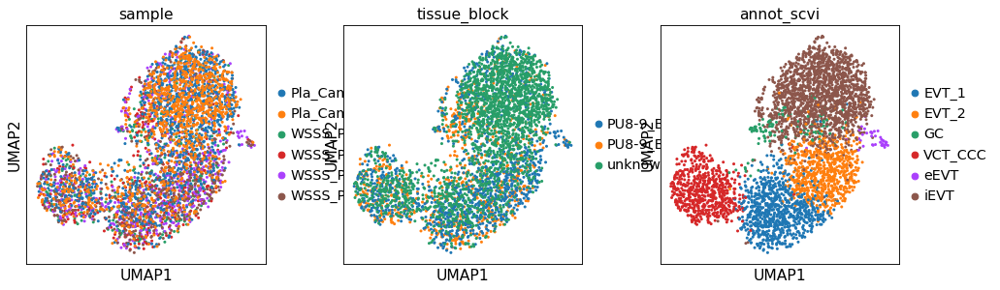

In [8]:
sc.pl.umap(adata,color=['sample','tissue_block','annot_scvi'])

## PAGA

## Denoising the graph and recomputing clusters

Now, recompute the graph using diffusion maps. Truncating at a few diffusion components amounts to denoising the graph - we just take a few of the first spectral components; this is very similar to denoising a data matrix using PCA.

**Note that this is not a required step** you might just as well go ahead with a non-denoised graph. In many situations, this will give you very decent results. Sometimes, denoising can remove too much structure.

In [9]:
adata

AnnData object with n_obs × n_vars = 4046 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed', 'louvain_scvi', 'louvain_scvi_n_latent_18', 'louvain_scvi_n_latent_18_R', 'annot_scvi'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 

In [10]:
sc.tl.diffmap(adata, neighbors_key='neighbors_scVI_n_latent_18_sample')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9682535  0.9419473  0.9010048  0.8976061  0.88950694
     0.8830438  0.86102146 0.8514719  0.8476204  0.83942497 0.83747995
     0.8274165  0.8224297  0.81442535]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


In [11]:
adata.obsm['X_diffmap'].shape

(4046, 15)

In [12]:
sc.pp.neighbors(adata, use_rep='X_diffmap') # or other pseudotime metric

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)


In [13]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


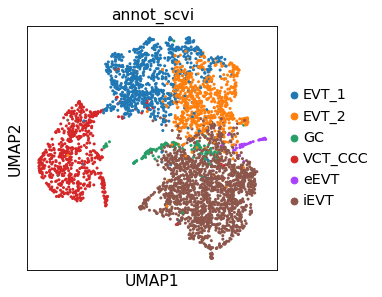

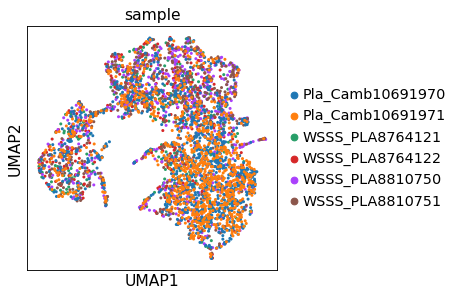

In [14]:
sc.pl.umap(adata, color=['annot_scvi'])
sc.pl.umap(adata, color=['sample'])

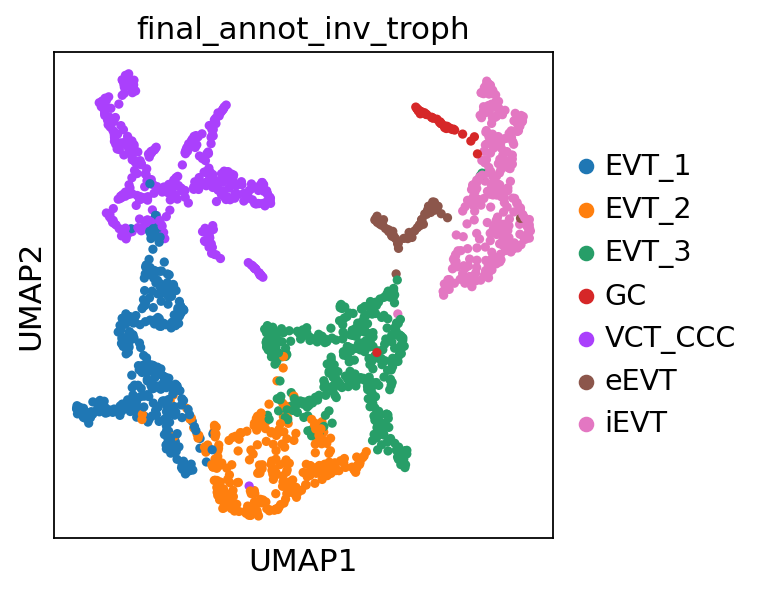

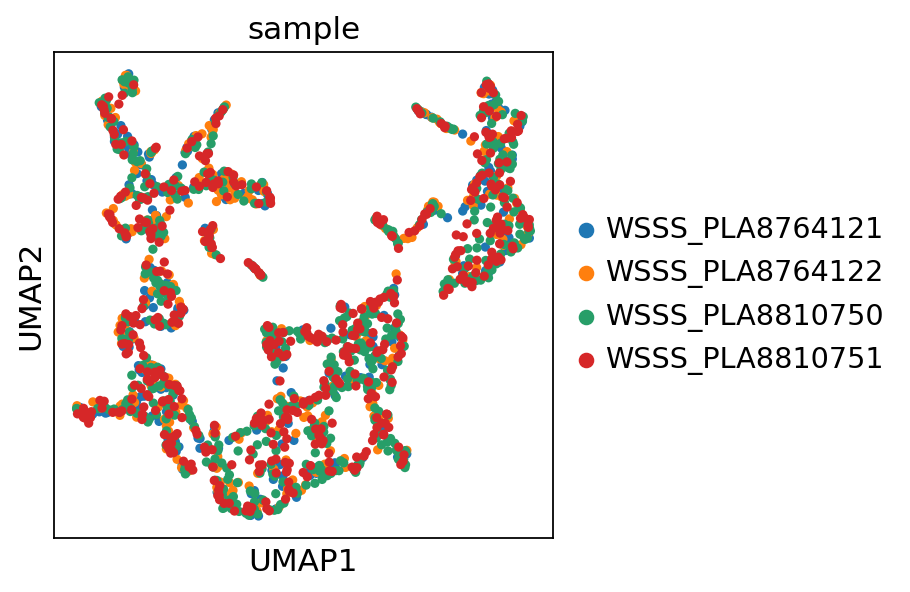

In [35]:
# older
sc.pl.umap(adata, color=['final_annot_inv_troph'])
sc.pl.umap(adata, color=['sample'])

## Compute PAGA graph

This is, use graph partitioning to calculate the connectivity structure  (i.e. the distance matrix) of the data at the chosen carse resolution (i.e. louvain clusters).

This allows us to identify connected and disconnected regions of the data.

In [15]:
sc.tl.paga(adata, groups='annot_scvi')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


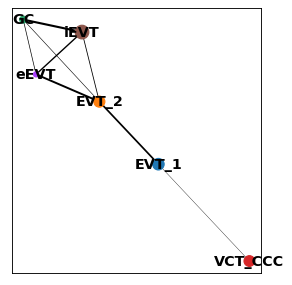

In [26]:
sc.pl.paga(adata, color=['annot_scvi'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.08, random_state=0)

--> added 'pos', the PAGA positions (adata.uns['paga'])


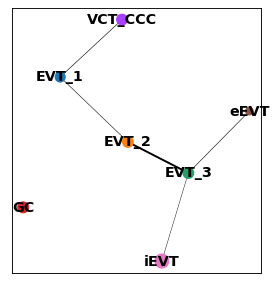

In [18]:
sc.pl.paga(adata, color=['final_annot_inv_troph'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.1, random_state=0)

--> added 'pos', the PAGA positions (adata.uns['paga'])


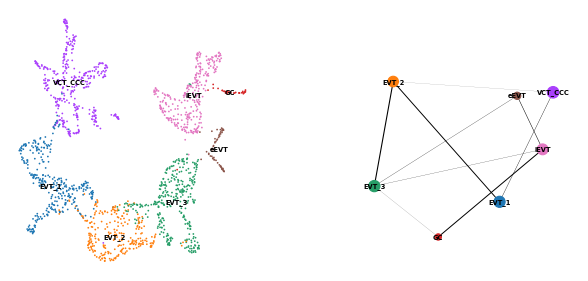

In [15]:
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.5, node_size_scale=0.6, random_state=0,
    legend_fontsize=6, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


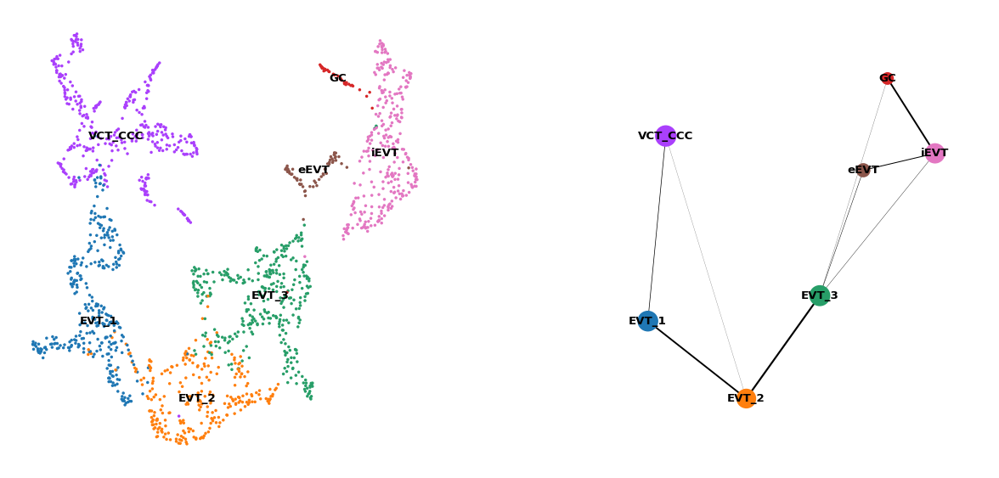

In [38]:
# older
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.5, node_size_scale=0.6, random_state=0,
    legend_fontsize=6, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


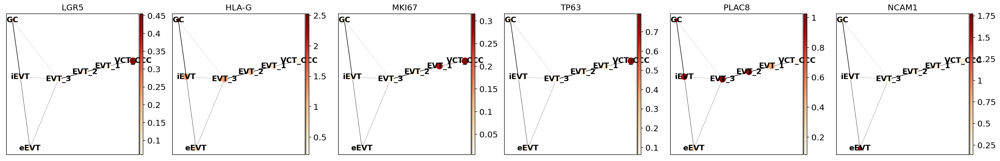

In [39]:
#sc.pl.paga(adata, color=['louvain_R_13',  'prelim_annot',  'sample'], threshold=0.01, node_size_scale=1.5, edge_width_scale=2)
sc.pl.paga(adata, color=['LGR5', 'HLA-G', 'MKI67',  'TP63',
                        'PLAC8','NCAM1'], cmap='OrRd',
           threshold=0.01, node_size_scale=0.6, edge_width_scale=0.5)

## Recomputing the emnbedding using PAGA-initialization

Use the PAGA result to improve on the single-cell layout

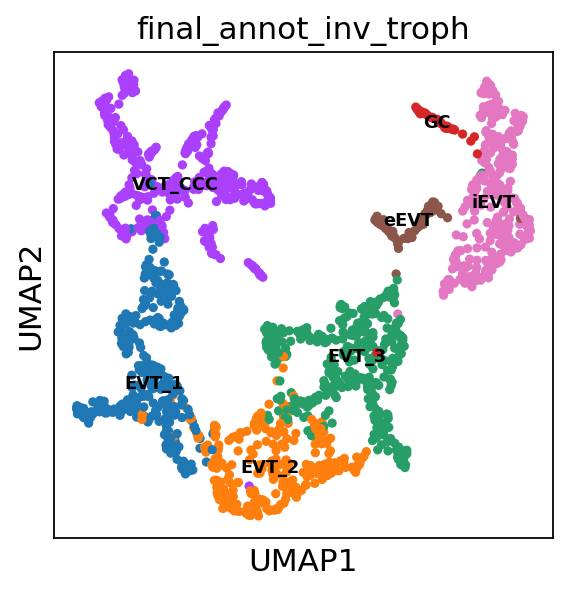

In [40]:
sc.pl.umap(adata, color=['final_annot_inv_troph'], legend_loc='on data', save='_annotated.pdf', legend_fontsize=8)

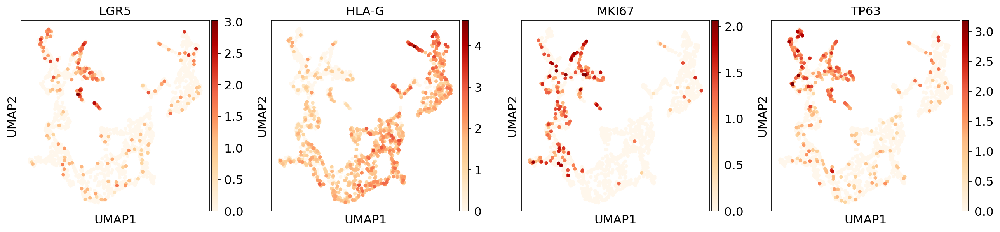

In [41]:
sc.pl.umap(adata, color=['LGR5', 'HLA-G', 'MKI67',  'TP63'], cmap='OrRd')

### Reconstructing gene changes along PAGA paths for a given set of genes

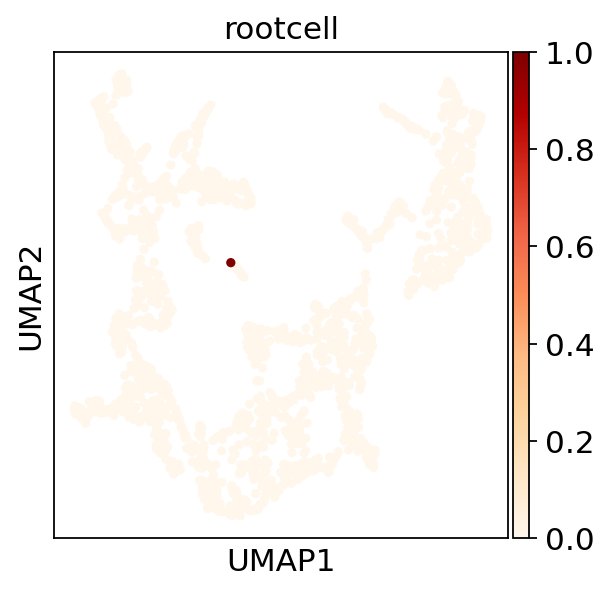

In [42]:
sc.pl.umap(adata, color='rootcell', cmap='OrRd')

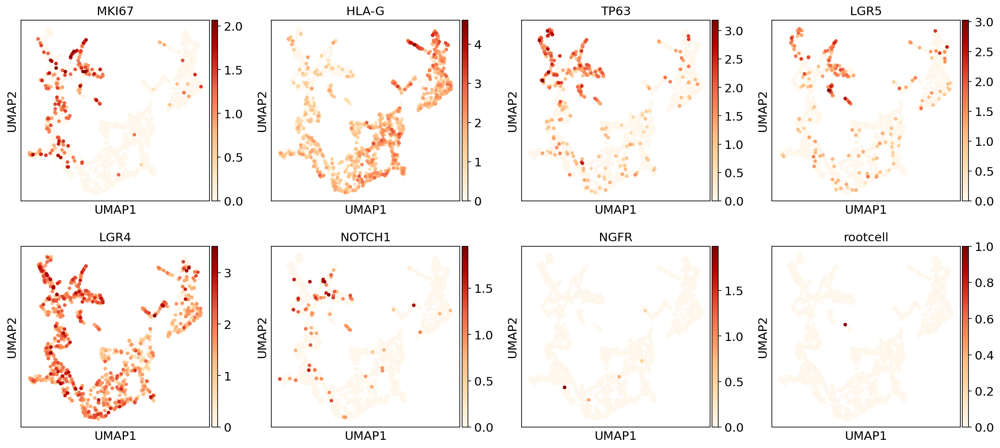

In [43]:
sc.pl.umap(adata,color=['MKI67','HLA-G','TP63','LGR5',
                       'LGR4','NOTCH1','NGFR','rootcell'],color_map='OrRd', palette = ['palevioletred','black'])

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


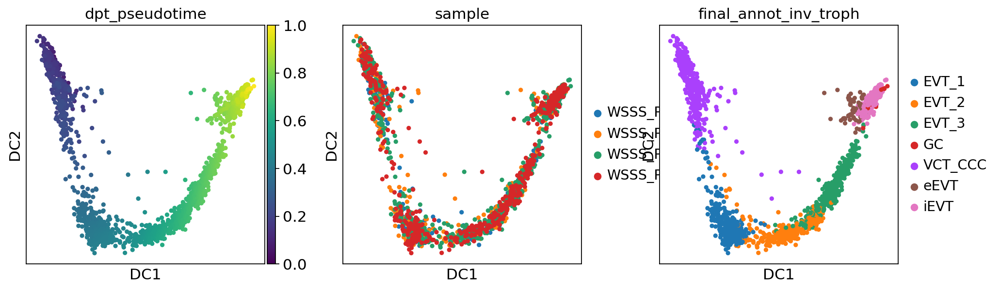

In [44]:
sc.tl.dpt(adata)
sc.pl.diffmap(adata,color=['dpt_pseudotime','sample','final_annot_inv_troph'])

In [45]:
adata

AnnData object with n_obs × n_vars = 1729 × 4790
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'barcode_sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_id', 'S_score', 'G2M_score', 'phase', 'celltype_predictions', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'probabilities', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'prelim_annot', 'louvain_R_2', 'prelim_annot_inv_troph', 'final_annot_inv_troph', 'root_score_+LGR5_+TP63', 'root_score_+LGR5_+TP63_-HLA-G_-MKI67', 'root_argmax_+LGR5_+TP63', 'root_argmax_+LGR5_+TP63_-HLA-G_-MKI67', 'rootcell', 'dpt_pseudotime', 'palantir_pseudotime'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable', 'means', 'dispersions'

Choose the colors of the clusters a bit more consistently.

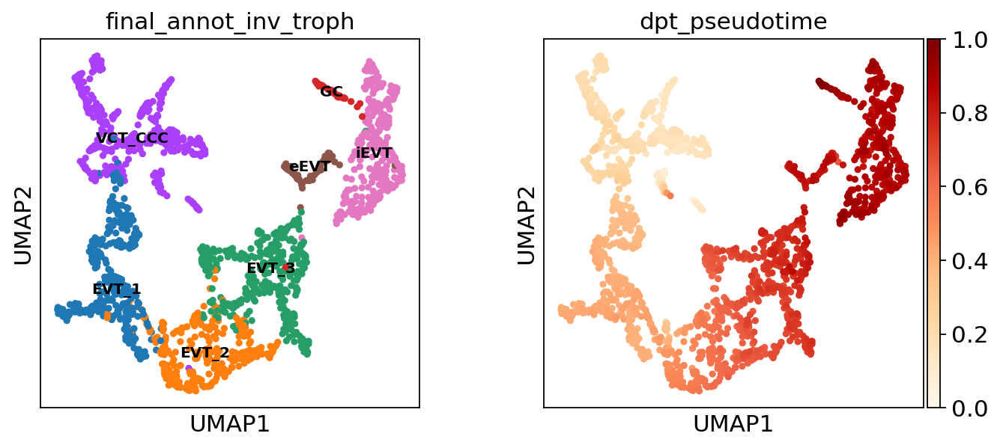

--> added 'pos', the PAGA positions (adata.uns['paga'])


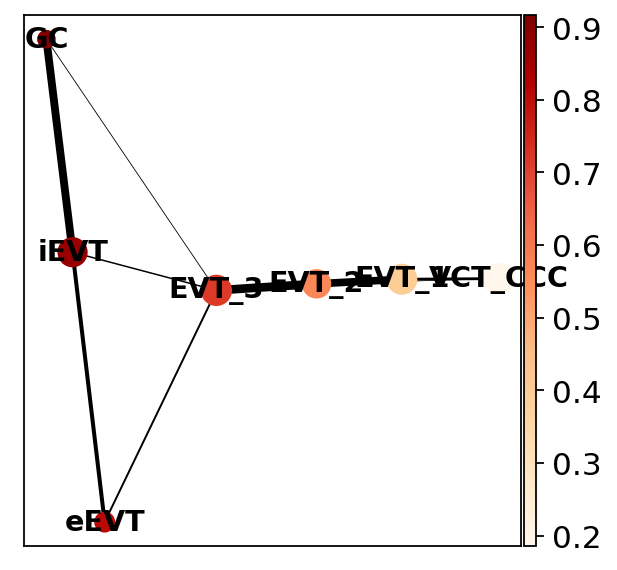

In [46]:
sc.pl.umap(adata, color=['final_annot_inv_troph', 'dpt_pseudotime'], cmap='OrRd', legend_loc='on data', save='_pseudotime.pdf', legend_fontsize=9)
sc.pl.paga(adata, color = 'dpt_pseudotime', threshold=0.01, cmap='OrRd', layout='fr', edge_width_scale=2)


In [47]:
adata

AnnData object with n_obs × n_vars = 1729 × 4790
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'barcode_sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_id', 'S_score', 'G2M_score', 'phase', 'celltype_predictions', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'probabilities', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'prelim_annot', 'louvain_R_2', 'prelim_annot_inv_troph', 'final_annot_inv_troph', 'root_score_+LGR5_+TP63', 'root_score_+LGR5_+TP63_-HLA-G_-MKI67', 'root_argmax_+LGR5_+TP63', 'root_argmax_+LGR5_+TP63_-HLA-G_-MKI67', 'rootcell', 'dpt_pseudotime', 'palantir_pseudotime'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable', 'means', 'dispersions'

In [19]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

In [20]:
# saving the PAGA object
adata.write(save_path + 'adata_PAGA_invading_trophoblast_20211107.h5ad')

In [5]:
adata = sc.read(save_path + 'adata_PAGA_invading_trophoblast_20201216.h5ad')

In [50]:
colors_final = ['#d895ea', # EVT_1
               '#9f6bac', # EVT_2
               'purple', # EVT_3
               '#DBC7DE', # GC
               '#e7a3c8', # VCT_CCC
               'red', # eEVT
               'mediumvioletred', # iEVT
    
]


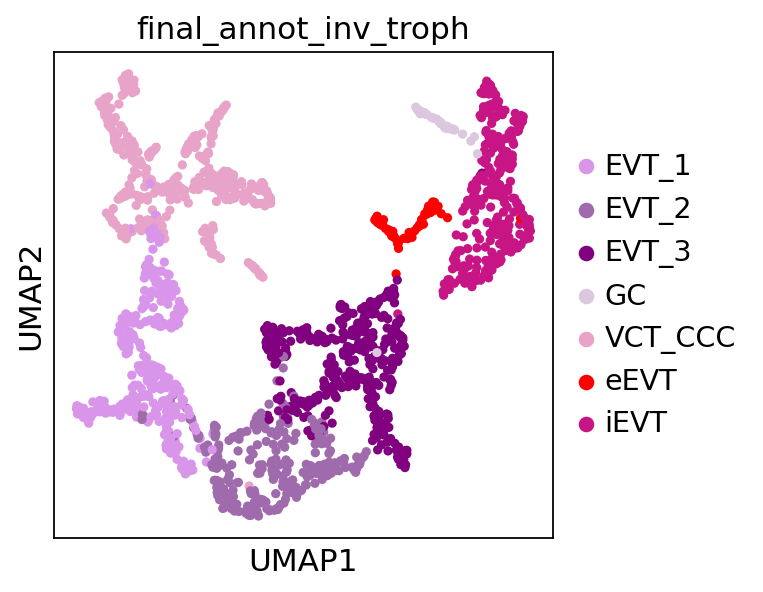

In [51]:
sc.pl.umap(adata, color='final_annot_inv_troph', palette = colors_final)

--> added 'pos', the PAGA positions (adata.uns['paga'])


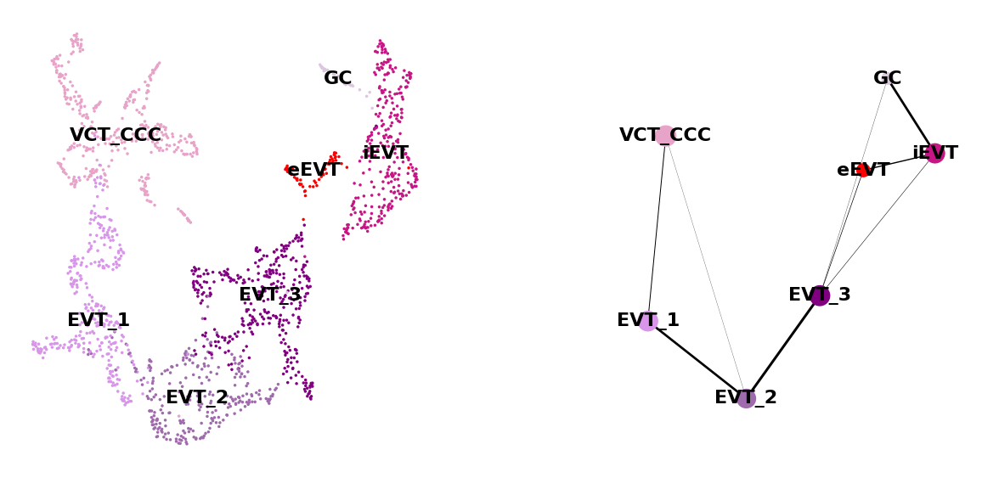

In [52]:
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.7, node_size_scale=0.6, random_state=0,
    legend_fontsize=10, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


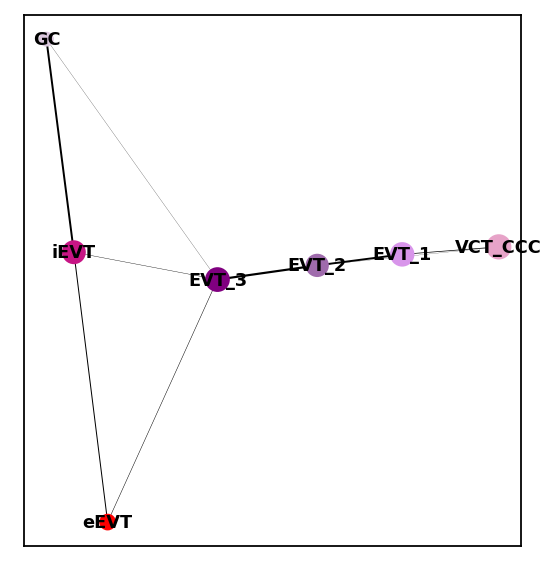

In [53]:
sc.pl.paga(adata, color=['final_annot_inv_troph'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.01, random_state=0, fontsize=8)

# Trying to run PAGA without denoising the graph

## Compute PAGA graph

This is, use graph partitioning to calculate the connectivity structure  (i.e. the distance matrix) of the data at the chosen carse resolution (i.e. louvain clusters).

This allows us to identify connected and disconnected regions of the data.

In [7]:
sc.tl.paga(adata, groups='final_annot_inv_troph')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


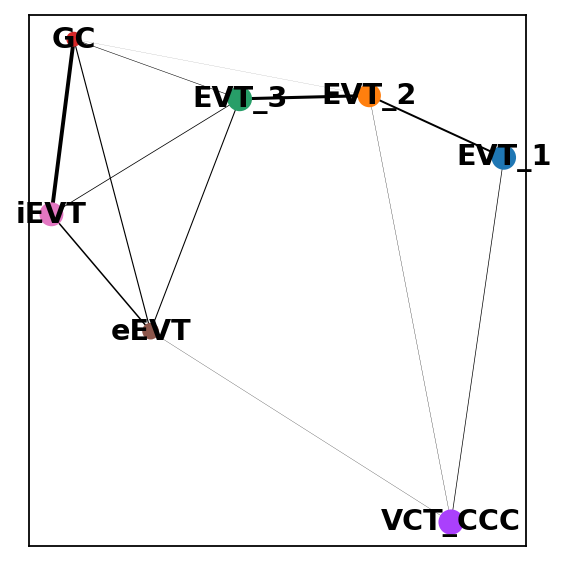

In [8]:
sc.pl.paga(adata, color=['final_annot_inv_troph'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.01, random_state=0)

--> added 'pos', the PAGA positions (adata.uns['paga'])


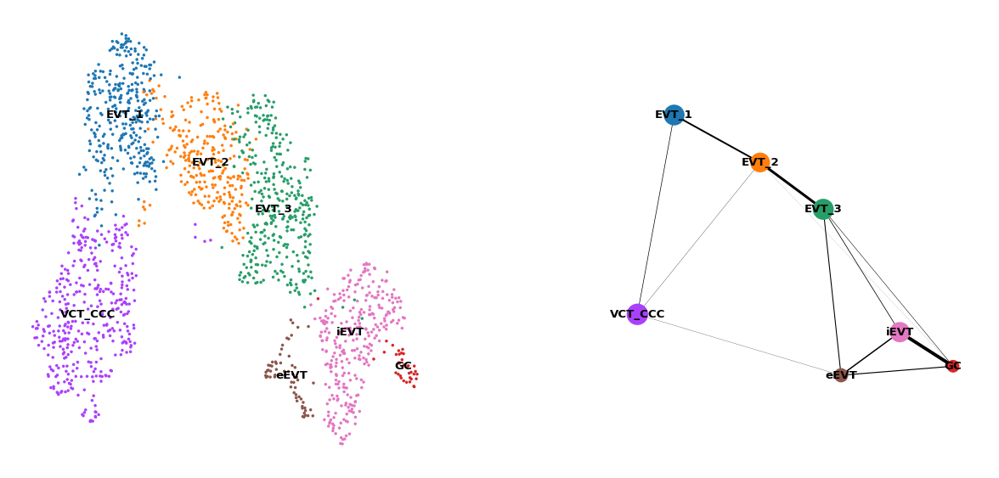

In [9]:
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.5, node_size_scale=0.6, random_state=0,
    legend_fontsize=6, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


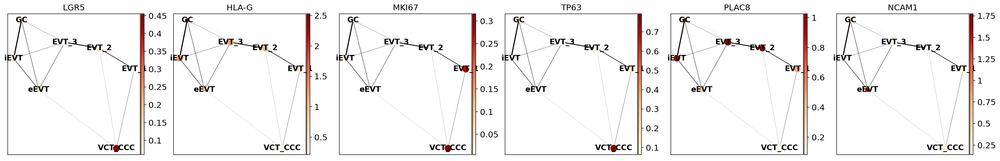

In [10]:
#sc.pl.paga(adata, color=['louvain_R_13',  'prelim_annot',  'sample'], threshold=0.01, node_size_scale=1.5, edge_width_scale=2)
sc.pl.paga(adata, color=['LGR5', 'HLA-G', 'MKI67',  'TP63',
                        'PLAC8','NCAM1'], cmap='OrRd',
           threshold=0.01, node_size_scale=0.6, edge_width_scale=0.5)

## Recomputing the emnbedding using PAGA-initialization

Use the PAGA result to improve on the single-cell layout

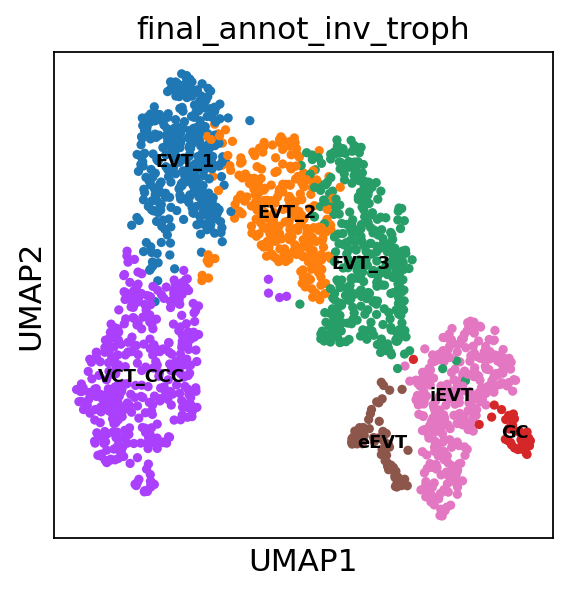

In [11]:
sc.pl.umap(adata, color=['final_annot_inv_troph'], legend_loc='on data', save='_annotated.pdf', legend_fontsize=8)

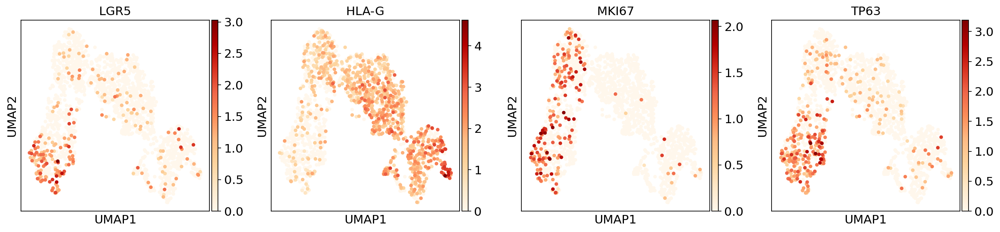

In [12]:
sc.pl.umap(adata, color=['LGR5', 'HLA-G', 'MKI67',  'TP63'], cmap='OrRd')

### Reconstructing gene changes along PAGA paths for a given set of genes

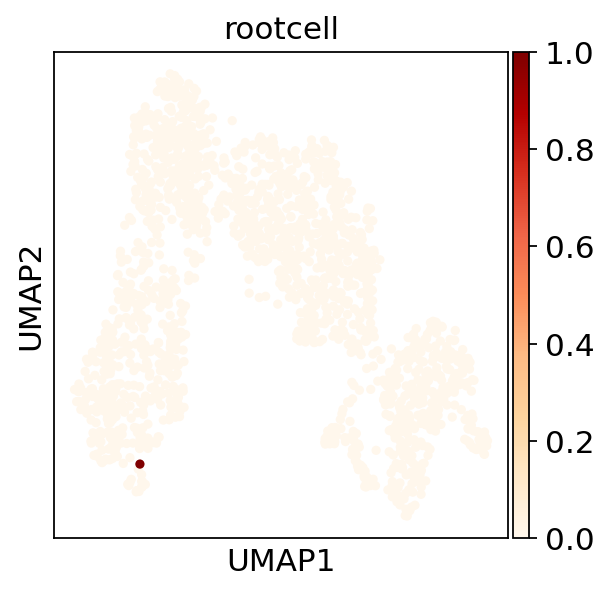

In [13]:
sc.pl.umap(adata, color='rootcell', cmap='OrRd')

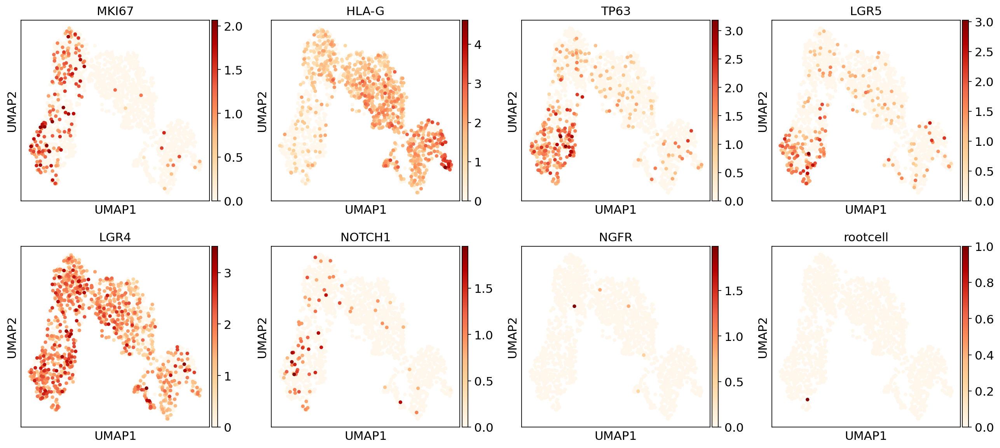

In [14]:
sc.pl.umap(adata,color=['MKI67','HLA-G','TP63','LGR5',
                       'LGR4','NOTCH1','NGFR','rootcell'],color_map='OrRd', palette = ['palevioletred','black'])

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


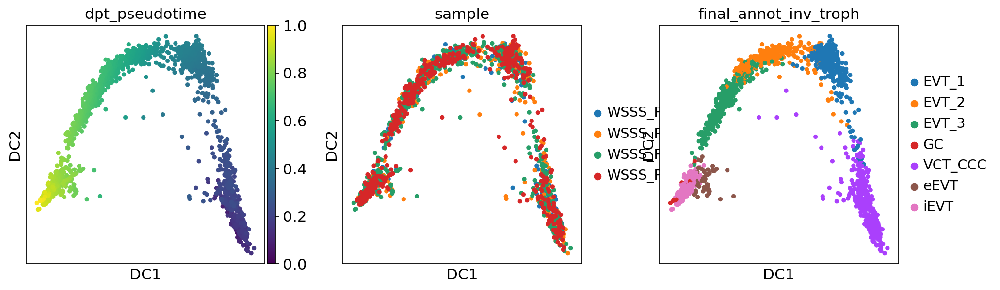

In [15]:
sc.tl.dpt(adata)
sc.pl.diffmap(adata,color=['dpt_pseudotime','sample','final_annot_inv_troph'])

In [16]:
adata

AnnData object with n_obs × n_vars = 1729 × 4790
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'barcode_sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_id', 'S_score', 'G2M_score', 'phase', 'celltype_predictions', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'probabilities', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'prelim_annot', 'louvain_R_2', 'prelim_annot_inv_troph', 'final_annot_inv_troph', 'root_score_+LGR5_+TP63', 'root_score_+LGR5_+TP63_-HLA-G_-MKI67', 'root_argmax_+LGR5_+TP63', 'root_argmax_+LGR5_+TP63_-HLA-G_-MKI67', 'rootcell', 'dpt_pseudotime', 'palantir_pseudotime'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable', 'means', 'dispersions'

Choose the colors of the clusters a bit more consistently.

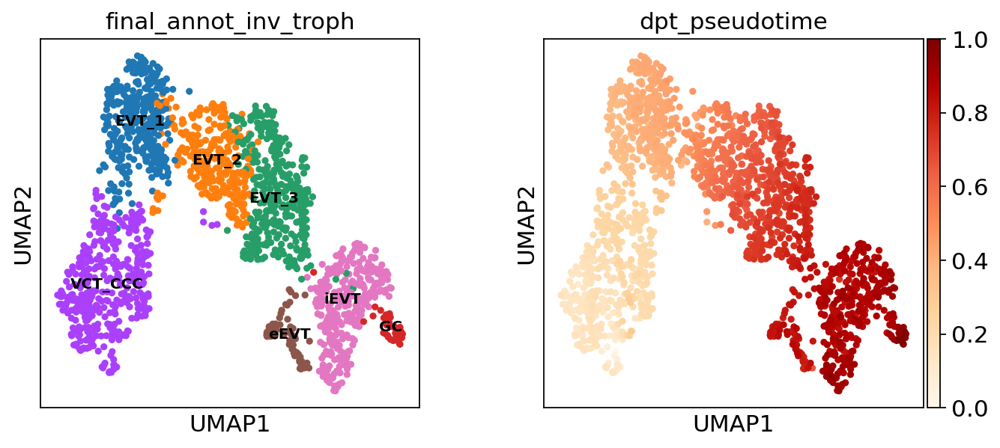

--> added 'pos', the PAGA positions (adata.uns['paga'])


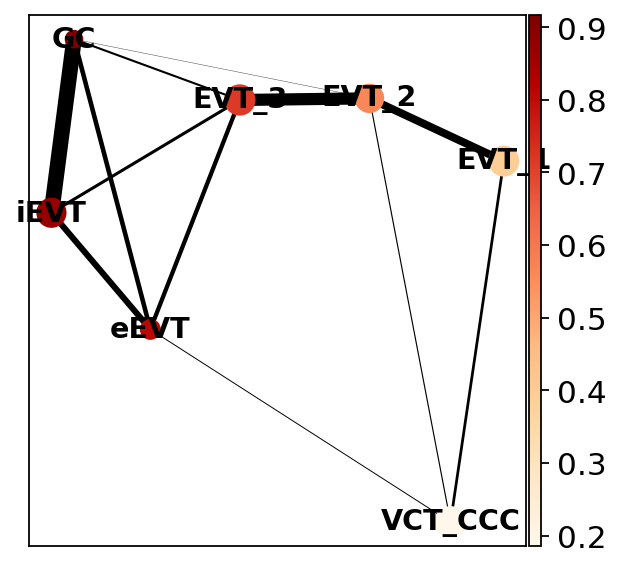

In [17]:
sc.pl.umap(adata, color=['final_annot_inv_troph', 'dpt_pseudotime'], cmap='OrRd', legend_loc='on data', save='_pseudotime.pdf', legend_fontsize=9)
sc.pl.paga(adata, color = 'dpt_pseudotime', threshold=0.01, cmap='OrRd', layout='fr', edge_width_scale=2)


In [18]:
adata

AnnData object with n_obs × n_vars = 1729 × 4790
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'barcode_sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'cell_id', 'S_score', 'G2M_score', 'phase', 'celltype_predictions', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'probabilities', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'prelim_annot', 'louvain_R_2', 'prelim_annot_inv_troph', 'final_annot_inv_troph', 'root_score_+LGR5_+TP63', 'root_score_+LGR5_+TP63_-HLA-G_-MKI67', 'root_argmax_+LGR5_+TP63', 'root_argmax_+LGR5_+TP63_-HLA-G_-MKI67', 'rootcell', 'dpt_pseudotime', 'palantir_pseudotime'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable', 'means', 'dispersions'

In [20]:
colors_final = ['#d895ea', # EVT_1
               '#9f6bac', # EVT_2
               'purple', # EVT_3
               '#DBC7DE', # GC
               '#e7a3c8', # VCT_CCC
               'red', # eEVT
               'mediumvioletred', # iEVT
    
]


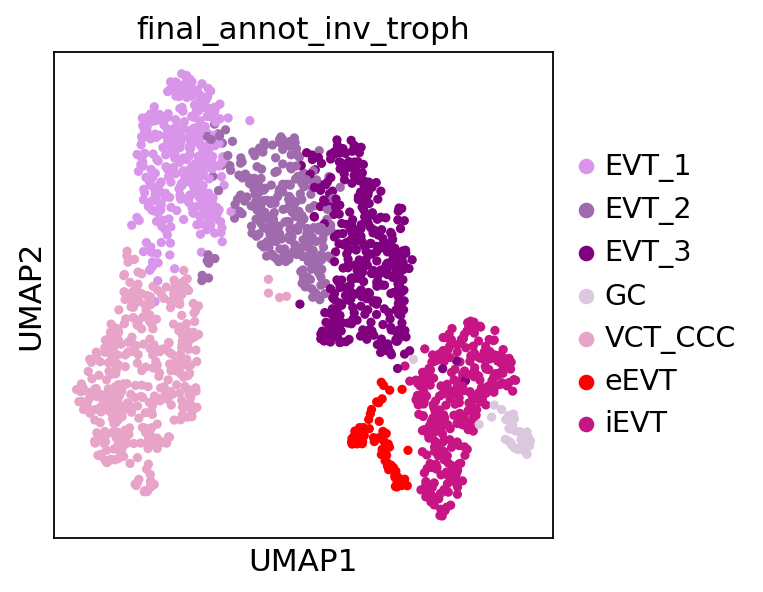

In [21]:
sc.pl.umap(adata, color='final_annot_inv_troph', palette = colors_final)

--> added 'pos', the PAGA positions (adata.uns['paga'])


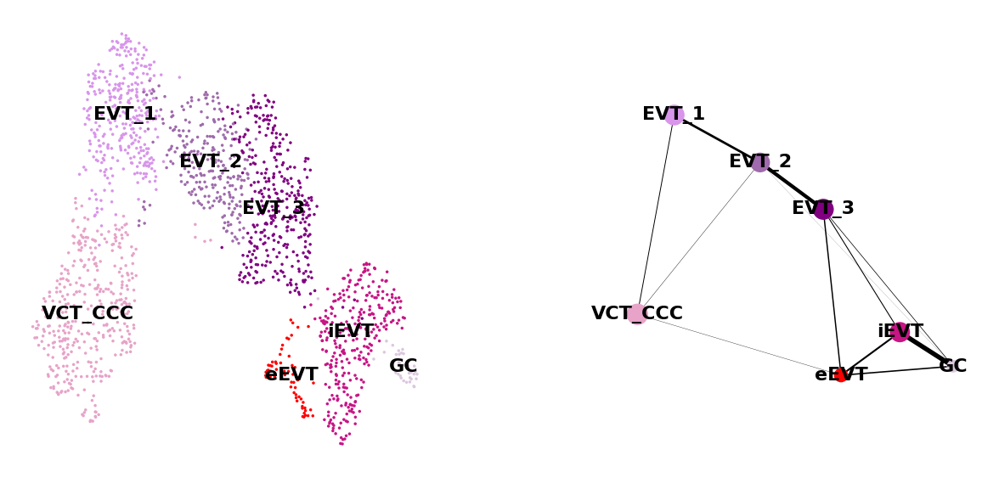

In [22]:
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.7, node_size_scale=0.6, random_state=0,
    legend_fontsize=10, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


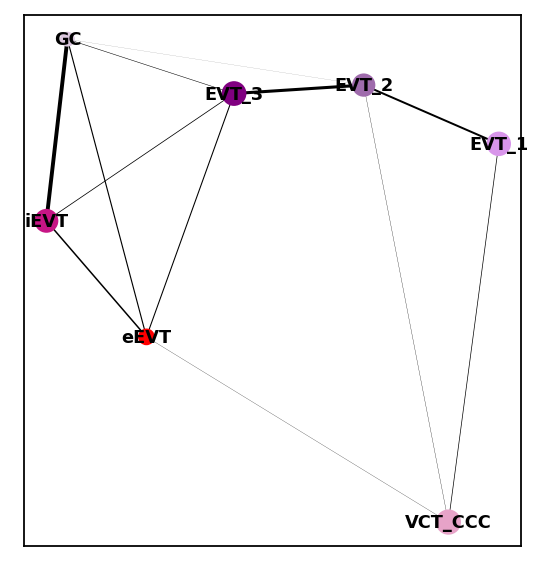

In [23]:
sc.pl.paga(adata, color=['final_annot_inv_troph'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.01, random_state=0, fontsize=8)

In [19]:
adata = sc.read(save_path+'adata_invading_trophoblast_with_trajectories_20201216.h5ad')

In [20]:
# what if we unite EVT_2 and EVT_3 into EVT_2_3?
adata.obs['annot_coarser_EVT_2_3'] = [ct if ct not in ['EVT_2','EVT_3'] else 'EVT_2_3' for ct in adata.obs['final_annot_inv_troph']]

... storing 'annot_coarser_EVT_2_3' as categorical


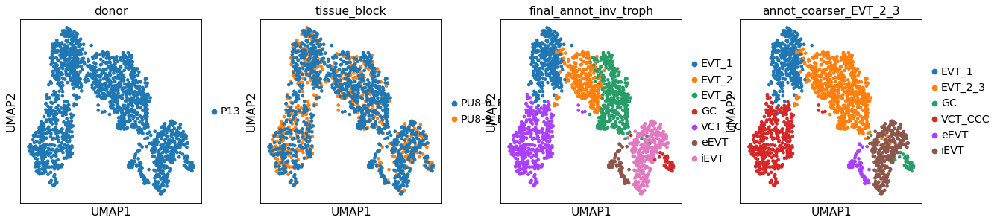

In [21]:
sc.pl.umap(adata,color=['donor','tissue_block','final_annot_inv_troph','annot_coarser_EVT_2_3'])

## PAGA

## Denoising the graph and recomputing clusters

Now, recompute the graph using diffusion maps. Truncating at a few diffusion components amounts to denoising the graph - we just take a few of the first spectral components; this is very similar to denoising a data matrix using PCA.

**Note that this is not a required step** you might just as well go ahead with a non-denoised graph. In many situations, this will give you very decent results. Sometimes, denoising can remove too much structure.

In [22]:
sc.tl.diffmap(adata)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9952855  0.98690534 0.97788715 0.96436083 0.9609315
     0.9554842  0.9501263  0.9421018  0.93699807 0.9288231  0.9281898
     0.92363304 0.91101617 0.909244  ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


In [23]:
adata.obsm['X_diffmap'].shape

(1729, 15)

In [24]:
sc.pp.neighbors(adata, use_rep='X_diffmap') # or other pseudotime metric

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [25]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


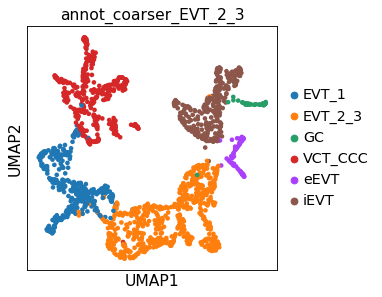

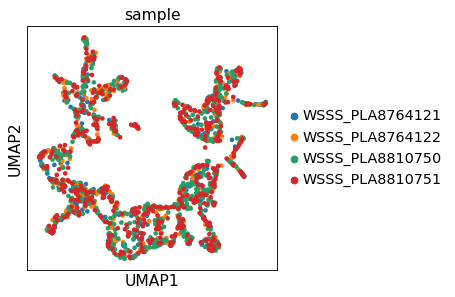

In [27]:
sc.pl.umap(adata, color=['annot_coarser_EVT_2_3'])
sc.pl.umap(adata, color=['sample'])

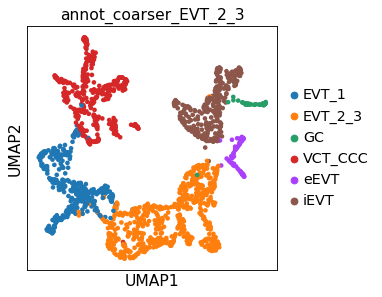

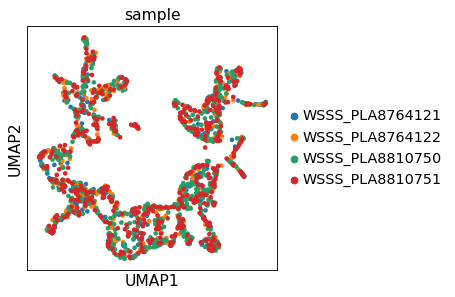

In [28]:
# older
sc.pl.umap(adata, color=['annot_coarser_EVT_2_3'])
sc.pl.umap(adata, color=['sample'])

## Compute PAGA graph

This is, use graph partitioning to calculate the connectivity structure  (i.e. the distance matrix) of the data at the chosen carse resolution (i.e. louvain clusters).

This allows us to identify connected and disconnected regions of the data.

In [29]:
sc.tl.paga(adata, groups='annot_coarser_EVT_2_3')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


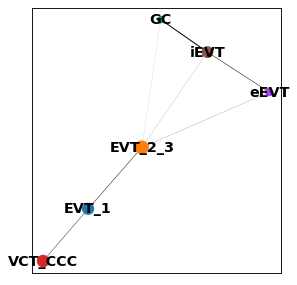

In [30]:
sc.pl.paga(adata, color=['annot_coarser_EVT_2_3'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.01, random_state=0)

--> added 'pos', the PAGA positions (adata.uns['paga'])


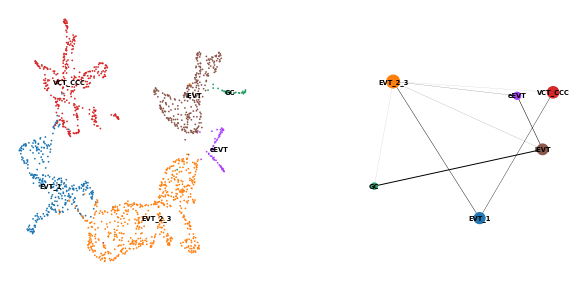

In [31]:
axs = sc.pl.paga_compare(
    adata, title='', right_margin=0.3, size=10,
    threshold=0.01, edge_width_scale=0.5, node_size_scale=0.6, random_state=0,
    legend_fontsize=6, fontsize=10, frameon=False, save=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])


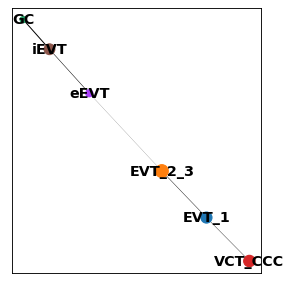

In [34]:
sc.pl.paga(adata, color=['annot_coarser_EVT_2_3'], 
           edge_width_scale=0.5, node_size_scale=0.6, threshold=0.03, random_state=0)

In [26]:
np.unique(adata.obs['final_annot_inv_troph'])

array(['EVT_1', 'EVT_2', 'EVT_3', 'GC', 'VCT_CCC', 'eEVT', 'iEVT'],
      dtype=object)

Select some of the marker gene names.

In [27]:
gene_names = ["LGR4", "LGR5", "HLA-G", "MMP3", "ADAM19"]

In [36]:
paths = [('prelim_annot', 'EVT_NCAM1', 'EVT_NOTCH1', 'EVT_PLAC8', 'SCT', 'VCT', 'VCT_LGR5',
       'VCT_fusing')]

In [37]:
adata.obs['distance'] = adata.obs['dpt_pseudotime']

ValueError: too many values to unpack (expected 2)

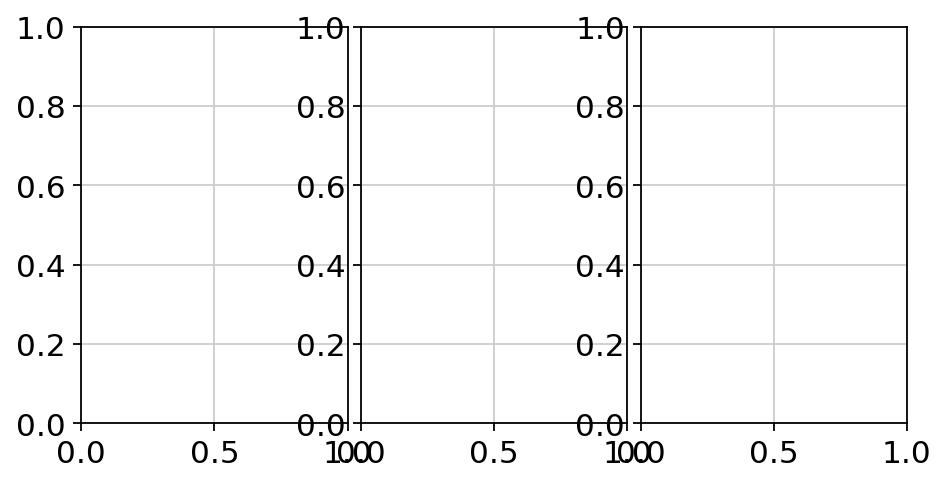

In [40]:
_, axs = plt.subplots(ncols=3, figsize=(6, 4), gridspec_kw={'wspace': 0.05, 'left': 0.12})
plt.subplots_adjust(left=0.05, right=0.98, top=0.82, bottom=0.2)
for ipath, (descr, path) in enumerate(paths):
    _, data = sc.pl.paga_path(
        adata, path, gene_names,                         
        show_node_names=False,
        ax=axs[ipath],
        ytick_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['dpt_pseudotime'],
        show_yticks=True if ipath==0 else False,
        show_colorbar=False,
        color_map='Greys',
        color_maps_annotations={'distance': 'viridis'},
        title='{} path'.format(descr),
        return_data=True,
        show=False)

In [41]:
adata.obs

,age,batch,bh_pval,cell_id,dataset,donor,n_counts,n_genes,percent_mito,sample,...,probabilities,celltype_predictions,louvain,origin_M_F,prelim_annot,louvain_R_13,is_18,rootcell,dpt_pseudotime,distance
index,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGATACATG-1,8-9_PCW,1,0.773693,AAACCCAAGATACATG-1_WSSS_PLA8764121,snRNA-seq,P13,2600.519531,1253,0.000000,WSSS_PLA8764121,...,0.633288,30_dS3,1,F,SCT,4,0,0,0.253822,0.253822
AAACCCAGTAGTCGGA-1,8-9_PCW,1,0.773693,AAACCCAGTAGTCGGA-1_WSSS_PLA8764121,snRNA-seq,P13,2794.482666,1431,0.000000,WSSS_PLA8764121,...,0.417236,19_blood_Tcells1,5,F,VCT,6,0,0,0.282236,0.282236
AAACGAAAGCATCGAG-1,8-9_PCW,1,0.773693,AAACGAAAGCATCGAG-1_WSSS_PLA8764121,snRNA-seq,P13,2922.248291,1751,0.000281,WSSS_PLA8764121,...,0.952646,33_Trophoblast,5,F,VCT_LGR5,11,0,0,0.252270,0.252270
AAACGAAAGCTTCATG-1,8-9_PCW,1,0.773693,AAACGAAAGCTTCATG-1_WSSS_PLA8764121,snRNA-seq,P13,1702.169556,610,0.000000,WSSS_PLA8764121,...,0.611676,13_M3,14,F,VCT_LGR5,"13,0",0,0,0.047499,0.047499
AAACGAAAGGTTCAGG-1,8-9_PCW,1,0.773693,AAACGAAAGGTTCAGG-1_WSSS_PLA8764121,snRNA-seq,P13,3203.233154,1918,0.000000,WSSS_PLA8764121,...,0.427984,27_dS1,0,F,VCT,15,0,0,0.329511,0.329511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTAGTCGT-1,8-9_PCW,9,0.826805,TTTGTTGGTTAGTCGT-1_WSSS_PLA8810751,snRNA-seq,P13,3444.302002,3150,0.000404,WSSS_PLA8810751,...,0.924220,33_Trophoblast,8,F,SCT,7,0,0,0.291078,0.291078
TTTGTTGTCAAGTCTG-1,8-9_PCW,9,0.826805,TTTGTTGTCAAGTCTG-1_WSSS_PLA8810751,snRNA-seq,P13,3050.646484,2326,0.000472,WSSS_PLA8810751,...,0.942978,33_Trophoblast,4,F,SCT,7,0,0,0.300674,0.300674
TTTGTTGTCGCTAGCG-1,8-9_PCW,9,0.826805,TTTGTTGTCGCTAGCG-1_WSSS_PLA8810751,snRNA-seq,P13,3268.120117,3177,0.000515,WSSS_PLA8810751,...,0.985502,33_Trophoblast,4,F,SCT,7,0,0,0.294864,0.294864


In [42]:
adata.obs.loc[:,['palantir_pseudotime','pseudotime_monocle3','dpt_pseudotime']]

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1418: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


,palantir_pseudotime,pseudotime_monocle3,dpt_pseudotime
index,,,
AAACCCAAGATACATG-1,NaN,NaN,0.253822
AAACCCAGTAGTCGGA-1,NaN,NaN,0.282236
AAACGAAAGCATCGAG-1,NaN,NaN,0.252270
AAACGAAAGCTTCATG-1,NaN,NaN,0.047499
AAACGAAAGGTTCAGG-1,NaN,NaN,0.329511
...,...,...,...
TTTGTTGGTTAGTCGT-1,NaN,NaN,0.291078
TTTGTTGTCAAGTCTG-1,NaN,NaN,0.300674
TTTGTTGTCGCTAGCG-1,NaN,NaN,0.294864


In [46]:
df_louv = {}

for louv_clus in list(np.unique(adata.obs['louvain'])):
    print('louvain cluster', louv_clus)
    df_louv[louv_clus] = adata[adata.obs['louvain'] == louv_clus].obs.loc[:,['palantir_pseudotime','pseudotime_monocle3','dpt_pseudotime']]
    #print(df_louv[louv_clus])
    for gene in gene_names:
        print('gene', gene)
        #print('len of current df_louv', len(df_louv))
        #print('len of gene vector',len(list(adata[adata.obs['louvain'] == louv_clus].raw[:,gene].X)))
        df_louv[louv_clus][gene] = list(adata[adata.obs['louvain'] == louv_clus].raw[:,gene].X)

louvain cluster 0
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 1
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 10
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 11
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 12
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 13
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 14
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 2
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 3
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 4
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 5
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 6
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 7
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 8
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
l

In [47]:
df_louv['0']

,palantir_pseudotime,pseudotime_monocle3,dpt_pseudotime,LGR4,LGR5,HLA-G,MMP3,ADAM19
index,,,,,,,,
AAACGCTAGTTCCGTA-1,0.207801,4.401168,0.030045,0.000000,0.0,2.295607,0.0,0.0
AAGCGAGGTGAATGAT-1,0.151168,7.871074,0.048837,0.000000,0.0,2.528482,0.0,0.0
AAGTGAAGTCTGTCCT-1,0.261673,8.308674,0.051389,0.000000,0.0,2.535732,0.0,0.0
AATCGTGCAGACATCT-1,0.297262,8.454594,0.028430,0.000000,0.0,2.260974,0.0,0.0
ACAGAAATCGTCGGGT-1,0.178778,4.664385,0.036809,1.760180,0.0,1.760180,0.0,0.0
...,...,...,...,...,...,...,...,...
TTTCCTCGTCAGACGA-1,0.227299,7.952680,0.046797,0.000000,0.0,2.366239,0.0,0.0
TTTCCTCGTCTTGCTC-1,0.195799,3.365939,0.023652,0.000000,0.0,2.127355,0.0,0.0
TTTCGATCACGGCTAC-1,0.169744,9.861799,0.055633,0.000000,0.0,2.321715,0.0,0.0


In [104]:
# gene by louvain cluster correlation of gene vectors and pseudotime values for dpt, spearmanr
corr_df_dpt = pd.DataFrame(index = gene_names, columns=list(np.unique(adata.obs['louvain'])))

for louv_clus in list(np.unique(adata.obs['louvain'])):
    print('louvain cluster', louv_clus)    
    adata_louv = adata[adata.obs['louvain'] == louv_clus]
    #print(df_louv[louv_clus])
    for gene in gene_names:
        print('gene', gene)
        #print('len of current df_louv', len(df_louv))
        #print('len of gene vector',len(list(adata[adata.obs['louvain'] == louv_clus].raw[:,gene].X)))
        curr_fit = spearmanr(adata_louv.raw[:,gene].X, adata_louv.obs['dpt_pseudotime'])
        if (curr_fit[1] < 0.05) & (curr_fit[0] > 0):
            corr_df_dpt.loc[gene,louv_clus] = curr_fit[1]
        else: 
            corr_df_dpt.loc[gene,louv_clus] = 1

louvain cluster 0
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 1
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 10
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 11
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 12
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 13
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 14
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 2
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 3
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 4
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 5
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 6
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 7
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
louvain cluster 8
gene LGR4
gene LGR5
gene HLA-G
gene MMP3
gene ADAM19
l

In [109]:
# p vals
corr_df_dpt = corr_df_dpt.fillna(0)

In [105]:
corr_df_dpt

,0,1,10,11,12,13,14,2,3,4,5,6,7,8,9
LGR4,1,1,7.99276e-09,0.000295427,1,1,1,9.64594e-23,1,5.76374e-20,1,7.77478e-05,5.26689e-09,1,1
LGR5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
HLA-G,4.60938e-62,5.7006e-35,1.06329e-67,3.37103e-06,1,1,1,1,1,1.25909e-127,1,3.996e-22,1.02403e-125,7.55482e-90,1.51866e-11
MMP3,1,6.40415e-05,1,1,1,1,1,1,1.38456e-07,0.00074779,0.000319106,1,0.03165,0.00297434,1
ADAM19,1,2.30816e-217,1.26274e-36,0.00489763,1,1,0.000141285,3.42285e-11,2.55547e-79,4.29459e-71,1.43972e-23,8.34564e-06,3.09646e-84,8.50007e-165,1


In [106]:
corr_df_dpt = corr_df_dpt[[str(i) for i in range(15)]]

In [107]:
corr_df_dpt

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
LGR4,1,1,9.64594e-23,1,5.76374e-20,1,7.77478e-05,5.26689e-09,1,1,7.99276e-09,0.000295427,1,1,1
LGR5,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
HLA-G,4.60938e-62,5.7006e-35,1,1,1.25909e-127,1,3.996e-22,1.02403e-125,7.55482e-90,1.51866e-11,1.06329e-67,3.37103e-06,1,1,1
MMP3,1,6.40415e-05,1,1.38456e-07,0.00074779,0.000319106,1,0.03165,0.00297434,1,1,1,1,1,1
ADAM19,1,2.30816e-217,3.42285e-11,2.55547e-79,4.29459e-71,1.43972e-23,8.34564e-06,3.09646e-84,8.50007e-165,1,1.26274e-36,0.00489763,1,1,0.000141285


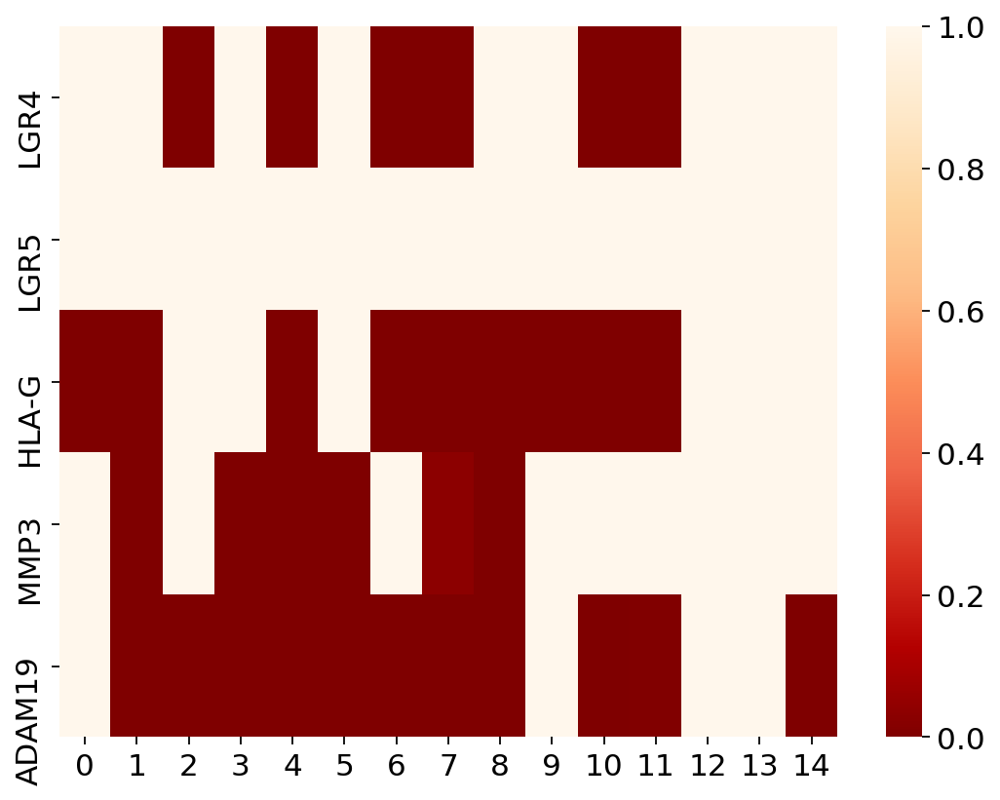

In [117]:
plt.figure(figsize=[8,6])
plt.yticks(rotation=70)
sns.heatmap(corr_df_dpt, cmap='OrRd_r')
plt.show()

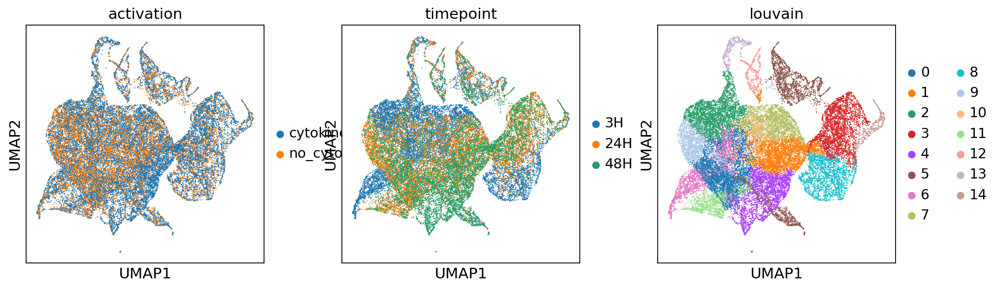

In [116]:
sc.pl.umap(adata,color=['activation','timepoint','louvain'])

## Save

# Slingshot

Please, save the anndata object as follows

```
adata_count = anndata.AnnData(X=np.expm1(adata.raw.X), var=adata.raw.var, obs=adata.obs, asview=False) # if adata.raw is log
```

or

```
adata_count = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, asview=False) # if adata.raw is not log
```

```
sc.pp.filter_genes(adata_count, min_cells=3)
adata_count.write('data/anndata_forSeurat.h5ad')
```


In [43]:
%%R
# If problems installing slingshot
# sudo apt-get update
# sudo apt-get install libglu1-mesa-dev 
# sudo apt-get install freeglut3-dev
# sudo apt-get install mesa-common-dev
# then
# install.packages("rgl")
# BiocManager::install("slingshot")
library(Seurat)
library(dplyr)
library(slingshot)
library(RColorBrewer)
library(destiny, quietly = TRUE)
library(gam)
library(harmony)
library(ggplot2)
library(pheatmap)
library(cowplot)

UsageError: Cell magic `%%R` not found.


In [5]:
sessionInfo()

R version 3.6.2 (2019-12-12)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 18.04.2 LTS

Matrix products: default
BLAS/LAPACK: /home/jovyan/my-conda-envs/myenvR/lib/libopenblasp-r0.3.8.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] splines   stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] cowplot_1.0.0      pheatmap_1.0.12    ggplot2_3.2.1      harmony_1.0       
 [5] Rcpp_1.0.3         gam_1.16.1         foreach_1.4.8      destiny_3.0.1     
 [9] RColorBrewer_1.1-2 slingshot_1.4.0    princurve_2.1.4    dplyr_0.8.4       
[13] Seurat_3.1.3      

loaded via a namespa

In [14]:
# we know these genes are relevant, use them to keep track on how good we're doing
known_genes = c("LGR6", "MKI67", "PAEP", "SCGB2A1", "KRT5", "CXCL8")

# Process with Seurat from raw

In [177]:
# Load and pre-process wth standard workflow
anndata <- ReadH5AD(file = '~/farm/endometrium/data/organoids-N3-TC-keep-ccg_forSeurat.h5ad')
allgenes = rownames(anndata)
anndata

Pulling expression matrices and metadata

Data is unscaled

Creating assay object

Storing X as raw and raw as counts

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
No variable feature expression found in h5ad file

No dimensional reduction information found

Assembling Seurat object

No nearest-neighbor graph

No additional layers found



An object of class Seurat 
22895 features across 30300 samples within 1 assay 
Active assay: RNA (22895 features)

In [16]:
# basic preprocessing
anndata <- NormalizeData(anndata, normalization.method = "LogNormalize", scale.factor = 10000)
anndata <- FindVariableFeatures(anndata, nfeatures = 2000)
anndata <- ScaleData(anndata, features = rownames(anndata))

Centering and scaling data matrix



Warning message:
“The following features are not present in the object: MLF1IP, not searching for symbol synonyms”
Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 1 features requested have not been scaled (running reduction without them): MLF1IP”
Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  HMGB2, MKI67, TOP2A, NUSAP1, CENPF, TPX2, UBE2C, CDK1, BIRC5, DLGAP5 
	   SMC4, HMMR, KIF20B, CENPA, AURKB, CCNB2, CDC20, CKS1B, GTSE1, KIF23 
	   RRM2, CENPE, NDC80, CDCA3, TACC3, AURKA, NUF2, KIF11, ANLN, TUBB4B 
Negative:  CCNE2, UNG, UBR7, POLA1, CASP8AP2, TIPIN, EXO1, WDR76, DTL, CHAF1B 
	   SLBP, MCM2, RPA2, CTCF, MCM5, BRIP1, CDCA7, RANGAP1, RAD51, POLD3 
	   MSH2, UHRF1, GAS2L3, G2E3, MCM6, PRIM1, HN1, CKAP5, BLM, CDC25C 
PC_ 2 
Positive:  PCNA, MCM6, CLSPN, CDC6, GINS2, MCM5, UNG, DTL, HELLS, CCNE2 
	   WDR76, MC

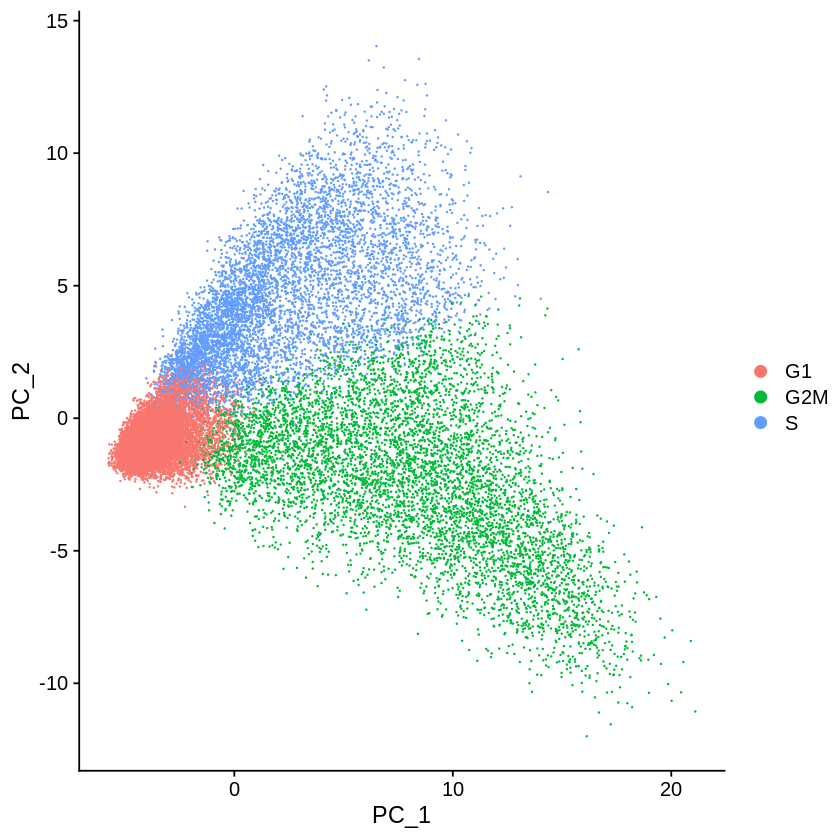

In [17]:
# check cell cycle effect
anndata <- CellCycleScoring(anndata, s.features = cc.genes$s.genes, g2m.features = cc.genes$g2m.genes, set.ident = TRUE)
anndata <- RunPCA(anndata, features = c(cc.genes$s.genes, cc.genes$g2m.genes))
DimPlot(anndata, reduction = 'pca')

In [18]:
# Regress out cell cycle - NOTE: subset the dataset to speed up process
anndata = subset(anndata, features = VariableFeatures(object = anndata))
anndata <- ScaleData(anndata, vars.to.regress = c("S.Score", "G2M.Score"), features = rownames(anndata))

Regressing out S.Score, G2M.Score

Centering and scaling data matrix



PC_ 1 
Positive:  IGFBP2, MYADM, UCHL1, NFIB, CRLF1, LCP1, LAMA3, CLU, CXCL8, TUBB2B 
	   RBP1, FBLN1, LRRFIP1, CDH6, NQO1, G6PD, AKAP12, DPP4, MYLK, CCDC146 
	   LINC00152, SPON1, MAP1B, BIN1, QPCT, IFITM2, HLA-B, CREB5, SPP1, LIMS3 
Negative:  S100A6, ANXA1, MUC1, PIFO, CALB1, PHLDA3, FBL, PHLDA1, TFPI, PITX1 
	   RP11-295M3.4, EEF1D, FGFR3, KRT19, FXYD3, TSC22D3, SLC40A1, ARRB2, LEMD1, AQP3 
	   LAD1, SMAGP, LMO4, SOX2, SLC25A37, LHX1, APOBEC3C, SPINK5, REC8, ALDH1A1 
PC_ 2 
Positive:  KRT18, KRT19, PHLDA2, KRT8, EMP1, GPRC5A, KRT23, S100A10, S100A6, AREG 
	   TM4SF1, KRT7, SFN, ANXA2, S100A16, SCEL, CLDN1, MACC1, CD44, LMNA 
	   KLK6, LAD1, DUSP5, LCN2, ANXA1, RAB11FIP1, CSTB, SLC2A1, AHNAK, TGM2 
Negative:  TMEM101, CAPS, STXBP6, WFDC2, CP, BCAM, ASRGL1, PLTP, ITM2C, CLDN10 
	   FBLN1, AGR3, STX18, DNALI1, CFI, EMID1, LGR5, SCGB1D2, HOXB4, CCDC146 
	   RP11-620J15.3, C5orf49, IGFBP2, EPB41L2, SOX17, TCF4, C1orf194, CFAP126, HMGB1, FAM183A 
PC_ 3 
Positive:  EEF1D, FBL, DBI, COTL1,

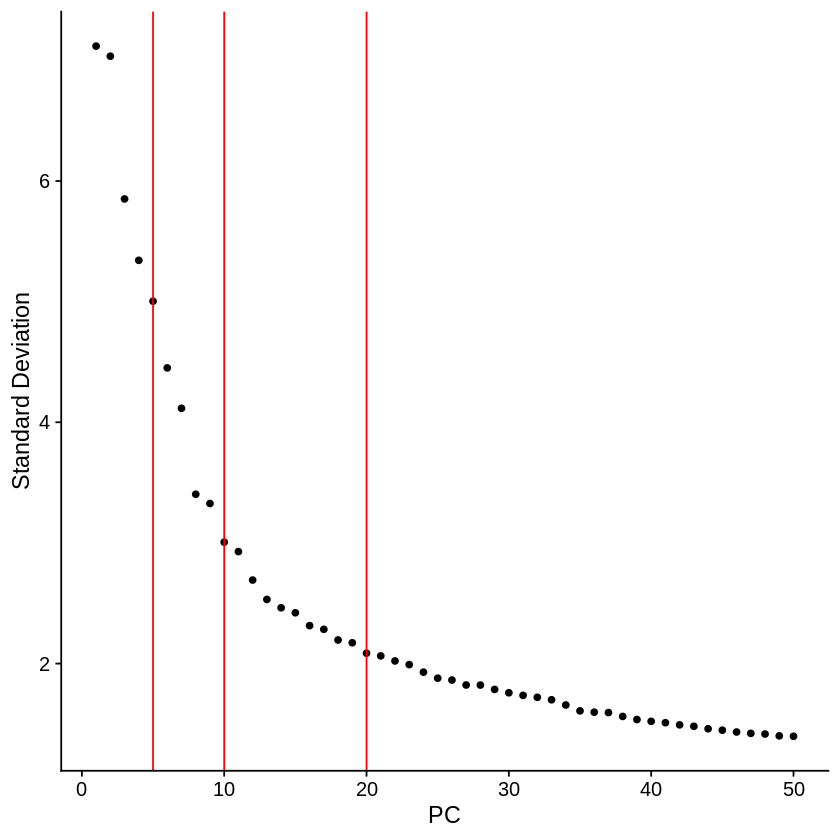

In [19]:
# Compute PCA
anndata <- RunPCA(anndata, features = VariableFeatures(object = anndata), seed.use = 1)
ElbowPlot(anndata, ndims = 50) + geom_vline(xintercept = 5, color = 'red') + geom_vline(xintercept = 10, color = 'red') + geom_vline(xintercept = 20, color = 'red')
npca = 19

In [20]:
# Correct donor's effect on PCA - no
anndata <- RunHarmony(anndata, group.by.vars = 'Donor', dims.use = 1:npca, theta = 0)

Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”


In [21]:
# Cluster
anndata <- FindNeighbors(anndata, dims = 1:npca, reduction = "harmony")
anndata <- RunUMAP(anndata, dims = 1:npca, reduction = "harmony")
anndata <- FindClusters(anndata, resolution = 0.6)

Computing nearest neighbor graph

Computing SNN

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
13:47:38 UMAP embedding parameters a = 0.9922 b = 1.112

13:47:38 Read 30300 rows and found 19 numeric columns

13:47:38 Using Annoy for neighbor search, n_neighbors = 30

13:47:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

13:47:45 Writing NN index file to temp file /tmp/Rtmp8WApoZ/file31a4cb3e454

13:47:45 Searching Annoy index using 1 thread, search_k = 3000

13:48:03 Annoy recall = 100%

13:48:05 Commencing smooth kNN distance cal

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 30300
Number of edges: 917703

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8553
Number of communities: 14
Elapsed time: 11 seconds


Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


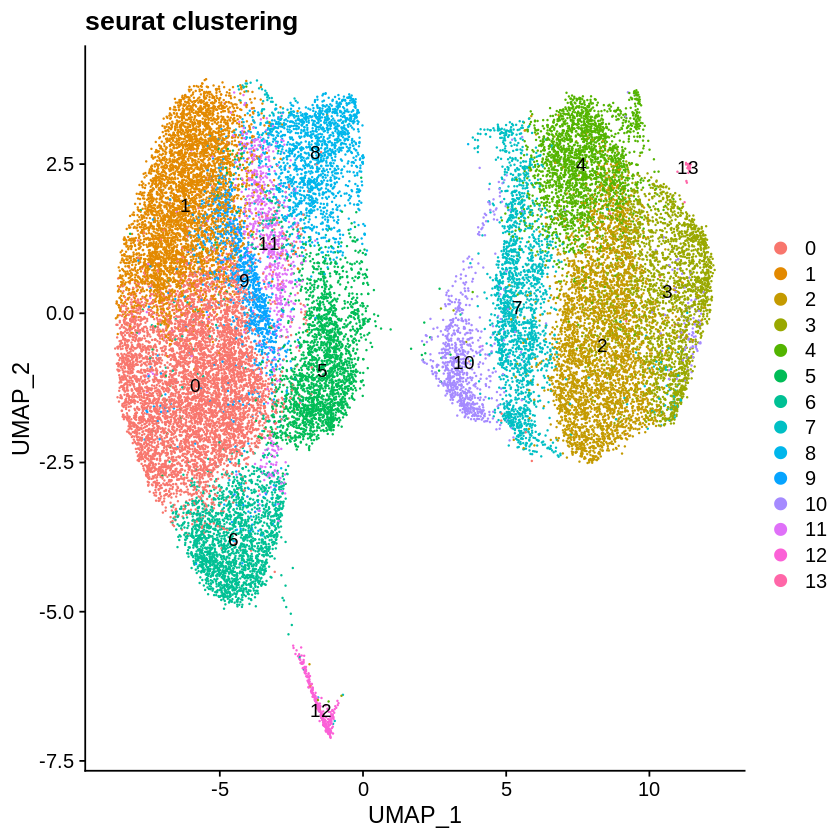

In [22]:
# Visualize
p1 = DimPlot(anndata, reduction = "umap", label = T) + ggtitle('seurat clustering')
p1

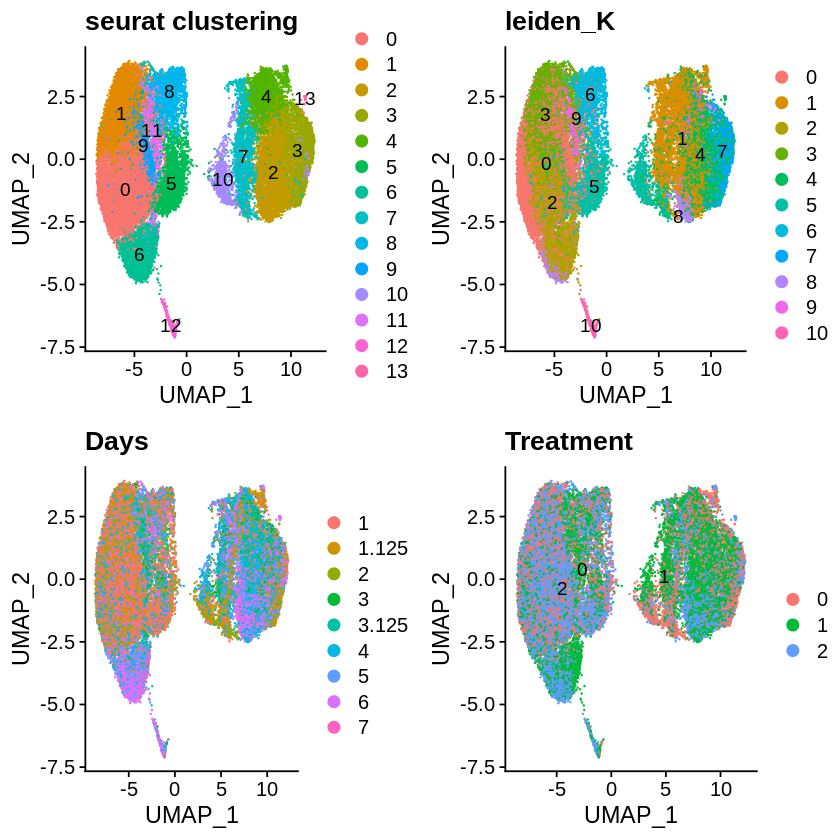

In [23]:
p2 = DimPlot(anndata, reduction = "umap", group.by = 'leiden.K', label = T) + ggtitle('leiden_K')
p3 = DimPlot(anndata, reduction = "umap", group.by = 'Days') + ggtitle('Days')
p4 = DimPlot(anndata, reduction = "umap", group.by = 'Treatment', label = T) + ggtitle('Treatment')
p5 = DimPlot(anndata, reduction = "umap", group.by = 'Donor') + ggtitle('Donor')
plot_grid(p1, p2, p3, p4)

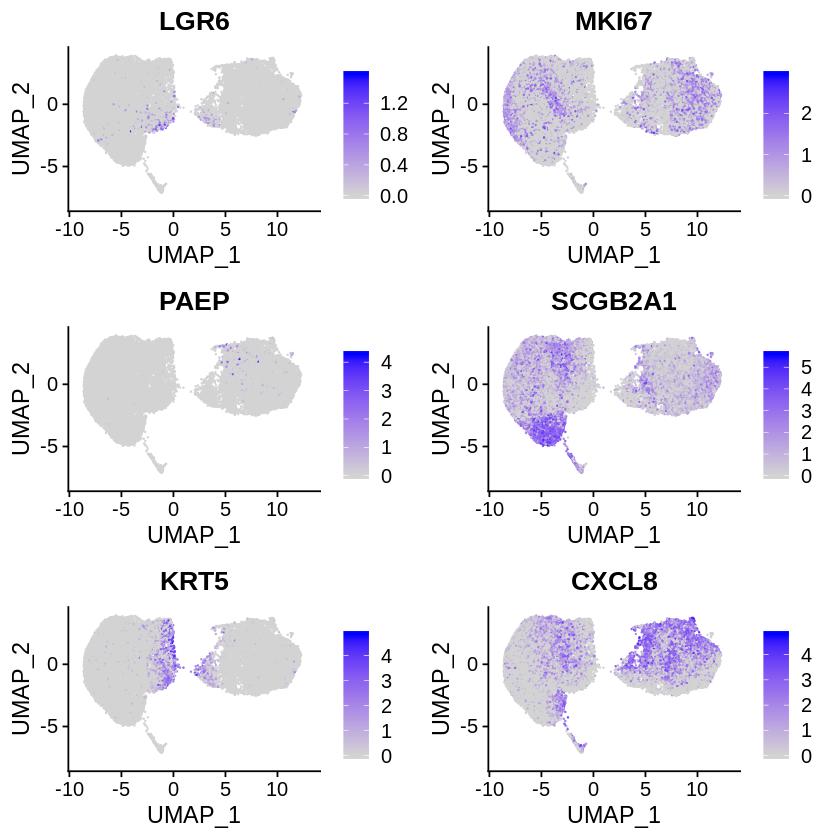

In [24]:
FeaturePlot(anndata, features = known_genes)

In [25]:
#save
saveRDS(anndata, file = '~/farm/endometrium/figures_luz_processing/seurat2slingshot.rds')

# Slingshot

In [1]:
# Filter HVGs and conver to SingleCellExperiment 
HVGs_anndata = subset(anndata, features = VariableFeatures(object = anndata))
anndata_sce <- as.SingleCellExperiment(HVGs_anndata)

ERROR: Error in subset(anndata, features = VariableFeatures(object = anndata)): object 'anndata' not found


In [27]:
## Run slingshot
# Slingshot is a two step process 
# 1) identifying the global lineage structure with a cluster-based minimum spanning tree (MST) and 
# 2) fitting simultaneous principal curves to describe each lineage.
# Inputs: a reduced dimensional matrix of coordinates and a set of cluster labels.
slingshot_anndata <- slingshot(anndata_sce, clusterLabels = 'seurat_clusters', reducedDim = 'UMAP', start.clus = '5')
SlingshotDataSet(slingshot_anndata)
saveRDS(slingshot_anndata, file = '~/farm/endometrium/figures_luz_processing/slingshot.rds')

Using full covariance matrix



class: SlingshotDataSet 

 Samples Dimensions
   30300          2

lineages: 5 
Lineage1: 5  11  9  0  6  12  
Lineage2: 5  10  7  2  3  13  
Lineage3: 5  11  9  1  
Lineage4: 5  10  7  4  
Lineage5: 5  11  8  

curves: 5 
Curve1: Length: 15.773	Samples: 10110.43
Curve2: Length: 16.713	Samples: 11255.21
Curve3: Length: 8.9377	Samples: 7968.84
Curve4: Length: 15.315	Samples: 7898.66
Curve5: Length: 12.9	Samples: 4436.07

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   2.163   4.681   4.858   7.163  15.773   18912 

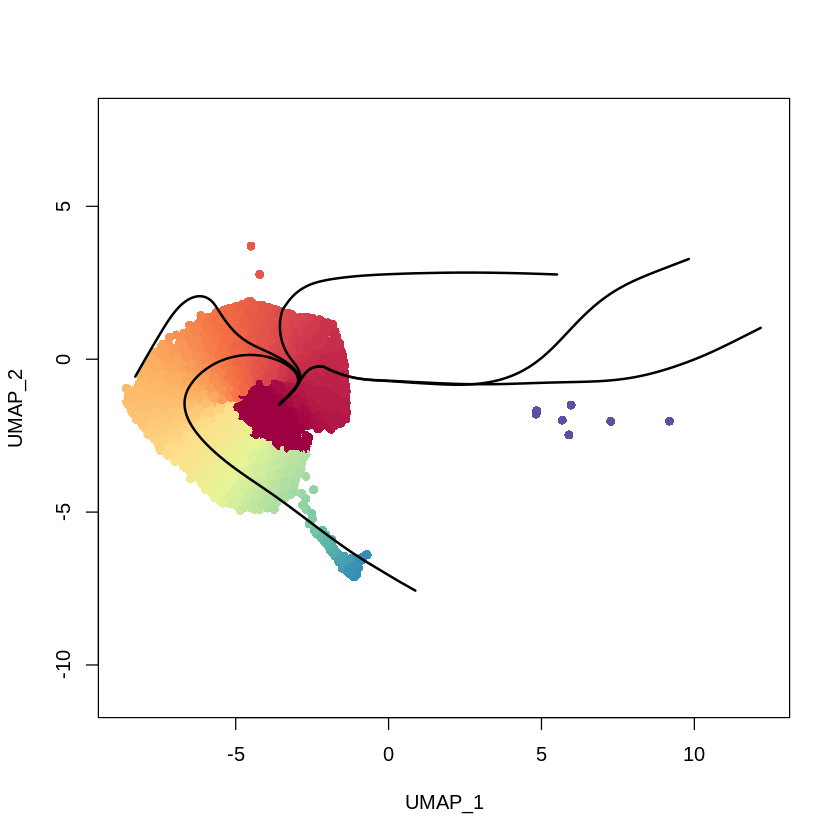

In [28]:
# Visualize the lineage 1
summary(slingshot_anndata$slingPseudotime_1)
colors <- colorRampPalette(brewer.pal(11,'Spectral')[-6])(100)
plotcol <- colors[cut(slingshot_anndata$slingPseudotime_1, breaks=100)]
plot(reducedDims(slingshot_anndata)$UMAP, col = plotcol, pch=16, asp = 1)
lines(SlingshotDataSet(slingshot_anndata), lwd=2, col='black')

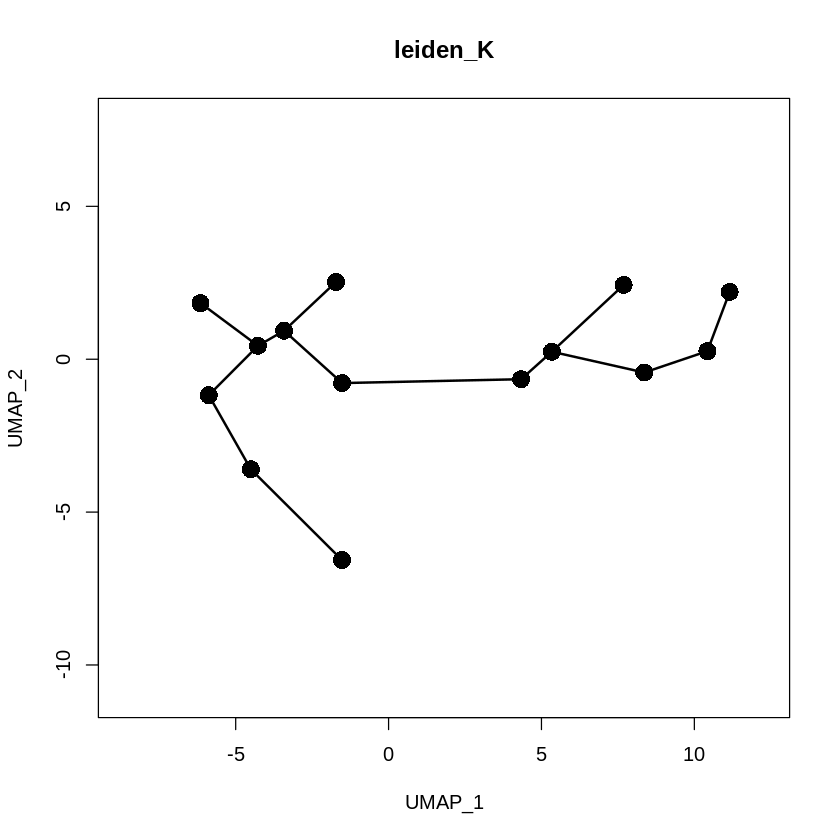

class: SlingshotDataSet 

 Samples Dimensions
   30300          2

lineages: 5 
Lineage1: 5  11  9  0  6  12  
Lineage2: 5  10  7  2  3  13  
Lineage3: 5  11  9  1  
Lineage4: 5  10  7  4  
Lineage5: 5  11  8  

curves: 5 
Curve1: Length: 15.773	Samples: 10110.43
Curve2: Length: 16.713	Samples: 11255.21
Curve3: Length: 8.9377	Samples: 7968.84
Curve4: Length: 15.315	Samples: 7898.66
Curve5: Length: 12.9	Samples: 4436.07

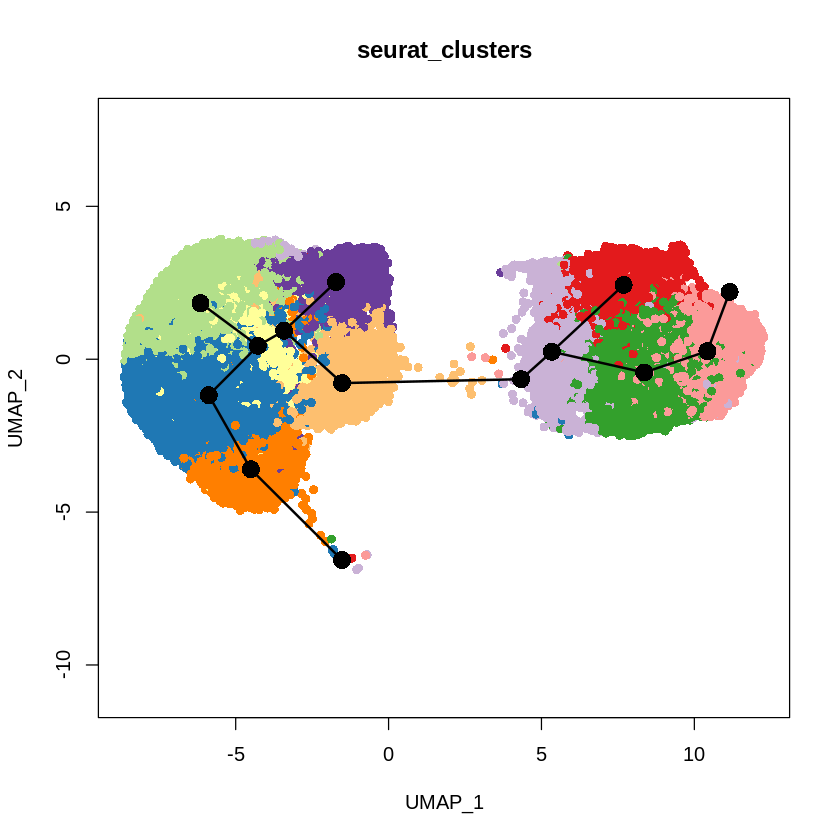

In [29]:
# See how the lineage structure was estimated by the cluster-based minimum spanning tree
plot(reducedDims(slingshot_anndata)$UMAP, col = brewer.pal(9,'Set1')[slingshot_anndata$leiden.K+1], pch=16, asp = 1, main = 'leiden_K')
lines(SlingshotDataSet(slingshot_anndata), lwd=2, type = 'lineages', col = 'black')
plot(reducedDims(slingshot_anndata)$UMAP, col = brewer.pal(11,'Paired')[as.numeric(slingshot_anndata$seurat_clusters)+1], pch=16, asp = 1, main = 'seurat_clusters')
lines(SlingshotDataSet(slingshot_anndata), lwd=2, type = 'lineages', col = 'black')
SlingshotDataSet(slingshot_anndata)

# DEGs in lineages

In [30]:
### DEGs over time
SlingshotDataSet(slingshot_anndata)
lineages = grep(names(slingshot_anndata@colData), pattern = 'slingPseudotime_', value = T)

class: SlingshotDataSet 

 Samples Dimensions
   30300          2

lineages: 5 
Lineage1: 5  11  9  0  6  12  
Lineage2: 5  10  7  2  3  13  
Lineage3: 5  11  9  1  
Lineage4: 5  10  7  4  
Lineage5: 5  11  8  

curves: 5 
Curve1: Length: 15.773	Samples: 10110.43
Curve2: Length: 16.713	Samples: 11255.21
Curve3: Length: 8.9377	Samples: 7968.84
Curve4: Length: 15.315	Samples: 7898.66
Curve5: Length: 12.9	Samples: 4436.07

In [119]:
# Working on lineage 1
lineage_index = 1

In [146]:
# Filter object to contain only 1 lineage
clusters_in_lineage = SlingshotDataSet(slingshot_anndata)@lineages[[lineage_index]]
cells_in_lineage = which(as.character(slingshot_anndata@colData$seurat_clusters) %in% clusters_in_lineage)
lineage_slingshot = slingshot_anndata[, cells_in_lineage]

In [147]:
# Extract time and gene values
t <- lineage_slingshot@colData[, lineages[lineage_index] ]
Y <- subset(HVGs_anndata, cells = rownames(slingshot_anndata@colData)[cells_in_lineage] )@assays$RNA@data

In [148]:
all(rownames(lineage_slingshot@colData) == colnames(Y))
Y = Y[, !is.na(t)]
t = t[!is.na(t)]

[1] TRUE

In [156]:
# For time effiency, only test the most variable genes
# Downsample clusters to ensure even representation of all the stages
sampling = list()
for (i in 1:20){
  random_cells = lapply(clusters_in_lineage, function(cl) sample(colnames(lineage_slingshot)[ lineage_slingshot$seurat_clusters == cl], size = 50, replace = T)  )
  random_cells = unlist(random_cells) %>% unique(.)
  var100 = VariableFeatures(FindVariableFeatures(subset(HVGs_anndata, cells = random_cells), nfeatures = 1000)) #head(names(sort(apply(Y[, random_cells],1,var),decreasing = TRUE)), n=1000)
  sampling[[i]] = var100
}
table(unlist(sampling))[ known_genes ]
frequent_genes = names(which(table(unlist(sampling)) >= 15 ))
# Remove mito and ribo genes
frequent_genes = grep('^MT-', frequent_genes, value = T, invert = T)
frequent_genes = grep('^RPS', frequent_genes, value = T, invert = T)
frequent_genes = grep('^RPL', frequent_genes, value = T, invert = T)
intersect(frequent_genes, known_genes)
length(frequent_genes)


   LGR6   MKI67    PAEP SCGB2A1    KRT5   CXCL8 
     17      20      17      20      20      20 

[1] "CXCL8"   "KRT5"    "LGR6"    "MKI67"   "PAEP"    "SCGB2A1"

[1] 594

In [157]:
frequent_genes = intersect(frequent_genes, rownames(Y))
Y <- Y[frequent_genes,]
intersect(frequent_genes, known_genes)

[1] "CXCL8"   "KRT5"    "MKI67"   "PAEP"    "SCGB2A1"

In [158]:
# fit a GAM with a loess term for pseudotime
gam_test  <- apply(Y,1,function(z){
  d <- data.frame(z=z, t=t)
  suppressWarnings({
    tmp <- suppressWarnings(gam(z ~ lo(t), data=d))
  })
  p <- c(tmp$coefficients[2], # statistic
         summary(tmp)[3][[1]][2,3]) # pvalue
  p
})

In [159]:
## Visualize
# pick out the top genes based on p-value and statistic
gam.stat = gam_test[1,]
gam.pval = gam_test[2,]
gam_test[, colnames(gam_test) %in% known_genes]
gam_test_sign = gam_test[ , gam.pval <= 0  ]
topgenes <- names(which(abs(gam.stat) > 0.01))
intersect(topgenes, known_genes)
length(topgenes)

,CXCL8,KRT5,MKI67,PAEP,SCGB2A1
lo(t),-0.025072,-0.01241847,-0.01954338,0.0008597291,0.1974381
,0.000000,0.00000000,0.00000000,0.0000000000,0.0000000


[1] "CXCL8"   "KRT5"    "MKI67"   "SCGB2A1"

[1] 201

In [160]:
# prepare data for plotting
# order genes expression over lineage pseudotime with a heatmap
heatdata <- Y[ topgenes, order(t, na.last = NA)]
# order leiden_K ids as well
heatclus <- lineage_slingshot$seurat_clusters[order(t)]
#heatmap(as.matrix(heatdata), Colv = NA, scale = 'none', ColSideColors = brewer.pal(9,"Set1")[heatclus+1])
annotation_col = as.data.frame(as.factor(heatclus))
rownames(annotation_col) = colnames(lineage_slingshot)[order(t, na.last = NA)]
names(annotation_col) = 'seurat_clusters'

In [265]:
# plot heatmap
dev.off()
pdf(file = paste0('~/farm/endometrium/figures_luz_processing/slingshot_lineage', lineage_index,'.pdf'), height = 10)
out = pheatmap(as.matrix(heatdata),  scale = 'none', cutree_rows = 10,
         clustering_distance_rows= "euclidean",
         color = colorRampPalette(c("white", "firebrick3"))(50),
         annotation_col = annotation_col, show_colnames = F, cluster_cols=F, 
         fontsize_row = 6)
dev.off()

null device 
          1

null device 
          1

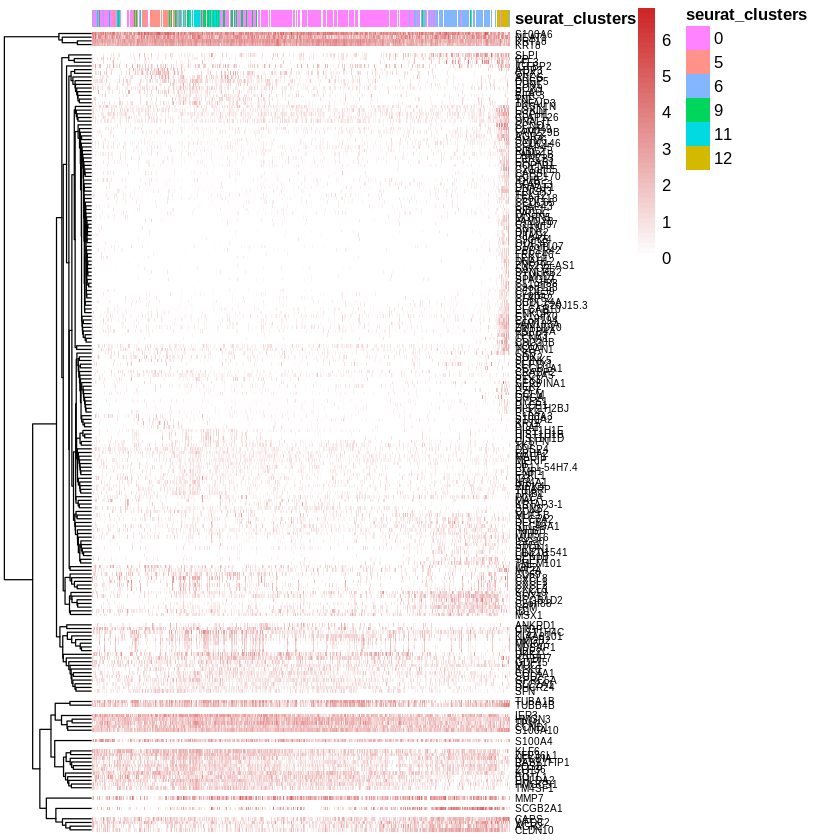

In [266]:
out


  1   2   3   4   5   6   7   8   9  10 
  4 153  19   5  11   4   1   1   1   2 


 1  2  3  4  5  6  7  8  9 10 
 6 68  9 13 29 24 27  5 12  8 

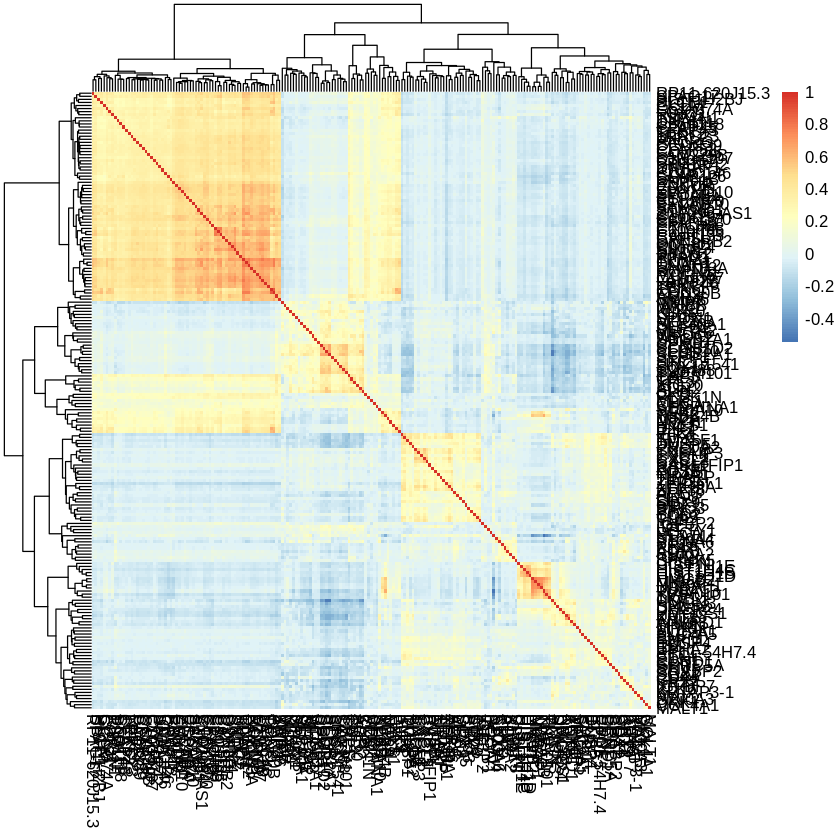

In [196]:
# Group genes in cluster for gene set enrichment
# Option A - extract groups from the dendogram
gene_clustersA = as.data.frame(sort(cutree(out$tree_row, k=10)))
names(gene_clustersA) = 'group'
gene_clustersA$gene = rownames(gene_clustersA)
table(gene_clustersA$group)
write.table(gene_clustersA, file = paste0('~/farm/endometrium/figures_luz_processing/slingshot_lineage', lineage_index,'_genegroupsA.txt'), quote = F, sep = '\t')
# Option B - extract groups from pearson correlation
gene_cor = pheatmap(cor(t(as.matrix(heatdata))))
gene_clustersB = as.data.frame(sort(cutree(gene_cor$tree_row, k=10)))
names(gene_clustersB) = 'group'
gene_clustersB$gene = rownames(gene_clustersB)
table(gene_clustersB$group)
write.table(gene_clustersB, file = paste0('~/farm/endometrium/figures_luz_processing/slingshot_lineage', lineage_index,'_genegroupsB.txt'), quote = F, sep = '\t')

### GSA on the DES along the trajectory

In [267]:
library(piano)
library(reshape2)

In [278]:
# Load genesets and filter those with > 2 genes in the anndata
genesets = readRDS(file = '~/farm/gsea/genesets/all_genesets.rds')
# genesetsf = lapply(genesets, intersect, allgenes)
genesetsf = lapply(genesets, intersect, rownames(HVGs_anndata))
genesetsf = genesetsf[ sapply(genesetsf, length) > 2 ]
gsc <- loadGSC(melt(genesetsf))
background_genes = intersect(allgenes, unlist(genesetsf))

In [279]:
# Compute enrichment gene_clustersB
groups_of_interest = names(which(table(gene_clustersB$group) >= 3))
results = list()
message('N genesets ', length(genesetsf))
message('N clusters ', length(groups_of_interest))
for ( gr in groups_of_interest ){
      print(gr)
      genes = subset(gene_clustersB, group == gr)$gene
      x  = runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, genes), gsSizeLim = c(3, 500))
      ORx = sapply(x$contingencyTable, function (ct) (ct[1,1]*ct[2,2]) / (ct[1,2]*ct[2,1]) )
      sig_idx =  which(x$pvalues < 0.001)
      if(sum(x$pvalues < 0.001) >  1){
        results[[gr]]  = data.frame(x$resTab[sig_idx, 1:4], OR= ORx[ sig_idx ], gr = gr, genes = paste(genes, collapse = ','))
        results[[gr]]$term = names(x$gsc)[ sig_idx ]
      }
      if(sum(x$pvalues < 0.001) ==  1){
        results[[gr]]  = data.frame(t(x$resTab[ sig_idx, 1:4]), OR= ORx[ sig_idx ], gr = gr, genes = paste(genes, collapse = ','))
        results[[gr]]$term = names(x$gsc)[ sig_idx ]
      }
}

N genesets 3247

N clusters 10



[1] "1"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 6 genes of interest in 3247 gene sets, using a background of 1844 non-interesting genes.



[1] "2"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 68 genes of interest in 3247 gene sets, using a background of 1787 non-interesting genes.



[1] "3"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 9 genes of interest in 3247 gene sets, using a background of 1841 non-interesting genes.



[1] "4"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 13 genes of interest in 3247 gene sets, using a background of 1837 non-interesting genes.



[1] "5"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 29 genes of interest in 3247 gene sets, using a background of 1821 non-interesting genes.



[1] "6"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 24 genes of interest in 3247 gene sets, using a background of 1828 non-interesting genes.



[1] "7"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 27 genes of interest in 3247 gene sets, using a background of 1824 non-interesting genes.



[1] "8"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 5 genes of interest in 3247 gene sets, using a background of 1845 non-interesting genes.



[1] "9"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 12 genes of interest in 3247 gene sets, using a background of 1839 non-interesting genes.



[1] "10"


Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“there are genes in gsc that are not in the universe, these will be removed before analysis”
Warning message in runGSAhyper(genes, gsc = gsc, universe = setdiff(background_genes, :
“not all genes given by argument genes are present in universe, these will be added to universe”
Analyzing the overrepresentation of 8 genes of interest in 3247 gene sets, using a background of 1842 non-interesting genes.



In [280]:
# Format output
df = do.call(rbind, results)
df = df[ df$Significant..in.gene.set. >= 2 , ]
rownames(df)= NULL
write.table(df, file = paste0('~/farm/endometrium/figures_luz_processing/slingshot_lineage', lineage_index,'_genegroupsB_GSA.txt'), quote = F, sep = '\t')
df[ df$p.value < 0.0001, c(6,1,5,8)]

,gr,p.value,OR,term
,<fct>,<dbl>,<dbl>,<chr>
4,2,4.718442e-05,Inf,GObpUniprot_epithelial_cilium_movement_involved_in_determination_of_left/right_asymmetry::GO:0060287
5,2,5.725910e-08,Inf,GObpUniprot_inner_dynein_arm_assembly::GO:0036159
6,2,2.348589e-05,55.781250,GObpUniprot_motile_cilium_assembly::GO:0044458
8,2,1.338940e-15,26.742424,uniprotKeyword_Cilium
9,2,7.185622e-09,68.240437,uniprotKeyword_Flagellum
10,2,4.131582e-16,25.372800,bgee_bronchial epithelial cell
11,2,1.385634e-20,28.031250,bgee_uterine tube
12,2,1.768516e-15,22.615714,bgee_epithelial cell
13,2,3.079688e-08,5.840336,bgee_epithe
